In [52]:
import pandas as pd
import numpy as np
import os
import math
import glob
from datetime import datetime
from datetime import timedelta
import h5py
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import KDTree
import time
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="pandas")

In [2]:
# cemaden_path = r'.\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\BRASIL_CEMADEN_TOTAL_DAILY_V3.h5'
cemaden_path = r'C:\Users\linde\OneDrive\Hidroweb\Consolidated Files\BRASIL_CEMADEN_TOTAL_DAILY.h5'
cemaden_path_v2 = r'.\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\BRASIL_CEMADEN_TOTAL_DAILY_V2.h5'
neighboring_data_path = r'.\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET'

In [3]:
def calculate_quality_label(row):
    if row['quality_index'] >= 90 and row['p_availability'] >= 99:
        return '1 - Excellent Quality'
    elif row['quality_index'] >= 85 and row['p_availability'] >= 95:
        return '2 - Good Quality'
    elif row['quality_index'] >= 80 and row['p_availability'] >= 90:
        return '3 - Acceptable Quality'
    elif row['quality_index'] >= 50:
        return '4 - Low Quality'
    else:
        return '5 - Very Low Quality'

In [4]:
def absolute_quality_label(row):
    if row['quality_label'] in ['Excellent Quality', 'Good Quality', 'Acceptable Quality']:
        return 'HQ'
    elif row['quality_label'] in ['Low Quality', 'Very Low Quality']:
        return 'LQ'
    else:
        return 'Unknown'

# Reading data

In [5]:
df_cemaden_data = pd.read_hdf(cemaden_path, key='table_data')
df_cemaden_data.rename(columns={'date': 'datetime'}, inplace=True)
df_cemaden_data.columns
df_cemaden_data['year'] = df_cemaden_data['datetime'].dt.year
df_cemaden_data = df_cemaden_data[(df_cemaden_data['year']<= 2020)
                                    & (df_cemaden_data['rain_mm']>= 0.0)
                                    & (df_cemaden_data['rain_mm']<= 600.0)
                                    ].reset_index(drop=True)
df_cemaden_data

,gauge_code,datetime,rain_mm,year
0,120010401A,2018-08-14,0.2,2018
1,120010401A,2018-08-15,37.4,2018
2,120010401A,2018-08-16,0.2,2018
3,120010401A,2018-08-17,0.0,2018
4,120010401A,2018-08-18,0.0,2018
...,...,...,...,...
6130838,CEMADEN_14,2019-04-26,0.0,2019
6130839,CEMADEN_14,2019-04-27,0.0,2019
6130840,CEMADEN_14,2019-04-28,0.0,2019
6130841,CEMADEN_14,2019-04-29,6.2,2019


In [6]:
df_cemaden_data['year'].unique()

array([2018, 2019, 2020, 2014, 2015, 2016, 2017])

In [7]:
df_cemaden_data['rain_mm'].describe()

count    6.130843e+06
mean     3.609943e+00
std      1.033683e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.600000e+00
max      5.994800e+02
Name: rain_mm, dtype: float64

In [8]:
# df_cemaden_data = pd.read_hdf(cemaden_path, key='table_data')
# df_cemaden_data['year'] = df_cemaden_data['datetime'].dt.year
# df_cemaden_data = df_cemaden_data[(df_cemaden_data['year']<= 2020)
#                                     & (df_cemaden_data['rain_mm']>= 0.0)
#                                     & (df_cemaden_data['rain_mm']<= 600.0)
#                                     ].reset_index(drop=True)
# df_cemaden_data

# # 130 acima de 600mm

In [9]:
df_cemaden_info = pd.read_hdf(cemaden_path, key = 'table_info')
df_cemaden_info['lat'] = df_cemaden_info['lat'].astype(float)
df_cemaden_info['long'] = df_cemaden_info['long'].astype(float)
df_cemaden_info.sort_values(['lat', 'long'], inplace=True)
df_cemaden_info.reset_index(drop=True, inplace=True)
df_cemaden_info

,gauge_code,state,city,name_station,long,lat
0,431100701A,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
1,430130501A,RS,ARROIO GRANDE,Centro,-53.085622,-32.238669
2,431420901A,RS,PEDRO OSÓRIO,Centro,-52.826981,-31.867047
3,431440702A,RS,PELOTAS,Centro,-52.342000,-31.770000
4,430466301A,RS,CAPÃO DO LEÃO,Centro,-52.764151,-31.764166
...,...,...,...,...,...,...
4173,140010003A,RR,BOA VISTA,Pricumã,-60.692624,2.804488
4174,140010002A,RR,BOA VISTA,Calunga,-60.674663,2.806589
4175,140010005A,RR,BOA VISTA,Caranã,-60.719258,2.844432
4176,140010001A,RR,BOA VISTA,Paraviana,-60.658979,2.859961


In [10]:
len(df_cemaden_data['gauge_code'].unique())

4178

In [11]:
years = df_cemaden_data['year'].sort_values(ascending=True).drop_duplicates().values.tolist()
years

[2014, 2015, 2016, 2017, 2018, 2019, 2020]

In [12]:
df_complete_info = pd.merge(df_cemaden_data, df_cemaden_info, on='gauge_code', how = 'inner').sort_values('lat', ascending = True).reset_index(drop=True)   
df_complete_info

,gauge_code,datetime,rain_mm,year,state,city,name_station,long,lat
0,431100701A,2020-03-02,0.0,2020,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
1,431100701A,2019-04-27,20.8,2019,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
2,431100701A,2019-04-26,17.8,2019,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
3,431100701A,2019-04-25,0.6,2019,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
4,431100701A,2019-04-24,0.0,2019,RS,JAGUARÃO,Pindorama,-53.368358,-32.558556
...,...,...,...,...,...,...,...,...,...
6130838,140070401A,2018-12-11,0.0,2018,RR,UIRAMUTÃ,Centro,-60.162963,4.594482
6130839,140070401A,2018-12-10,0.0,2018,RR,UIRAMUTÃ,Centro,-60.162963,4.594482
6130840,140070401A,2018-12-09,0.0,2018,RR,UIRAMUTÃ,Centro,-60.162963,4.594482
6130841,140070401A,2018-12-27,0.4,2018,RR,UIRAMUTÃ,Centro,-60.162963,4.594482


# Preclassif

In [13]:
# Add a year column to the dataframe
df_cemaden_data['year'] = df_cemaden_data['datetime'].dt.year

# Group by gauge_code and year
grouped = df_cemaden_data.groupby(['gauge_code', 'year'])

# Calculate annual_rainfall_mm, active_days, and consecutive_dry_days
def calculate_metrics(group):
    annual_rainfall_mm = group['rain_mm'].sum()
    active_days = (group['rain_mm'] >= 0.0).sum()
    
    # Calculate consecutive dry days
    dry_days = (group['rain_mm'] == 0.0).astype(int)
    # Calculate the maximum number of consecutive dry days
    consecutive_dry_days = (dry_days.groupby((dry_days != dry_days.shift()).cumsum()).cumsum() * dry_days).max()
    
    return pd.Series({
        'annual_rainfall_mm': annual_rainfall_mm,
        'active_days': active_days,
        'consecutive_dry_days': consecutive_dry_days
    })

In [14]:
df_preclassif = grouped.apply(calculate_metrics).reset_index()
df_preclassif['preclassif'] = df_preclassif.apply(
    lambda row: 'LQ' if (row['annual_rainfall_mm'] < 300 or row['annual_rainfall_mm'] > 6000
                        #  or row['active_days'] < 305
                         or row['consecutive_dry_days'] > 200) else "", axis=1)
df_preclassif

C:\Users\linde\AppData\Local\Temp\ipykernel_22688\3678795309.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_preclassif = grouped.apply(calculate_metrics).reset_index()


,gauge_code,year,annual_rainfall_mm,active_days,consecutive_dry_days,preclassif
0,110018901A,2018,969.740000,136.0,21.0,
1,110018901A,2019,1786.230000,346.0,49.0,
2,110018901A,2020,347.270000,38.0,4.0,
3,110020501A,2014,108.270409,16.0,2.0,LQ
4,110020501A,2017,138.460000,6.0,0.0,LQ
...,...,...,...,...,...,...
22768,CEMADEN_12,2019,598.120000,90.0,5.0,
22769,CEMADEN_12,2020,398.050000,31.0,1.0,
22770,CEMADEN_13,2019,51.800000,23.0,7.0,LQ
22771,CEMADEN_14,2018,436.400000,92.0,3.0,


In [15]:
preclassif_counts = df_preclassif['preclassif'].value_counts()
print(preclassif_counts)

preclassif
      18548
LQ     4225
Name: count, dtype: int64


In [16]:
preclassif_counts['LQ'] / preclassif_counts.sum()

0.18552672023887937

In [17]:
df_preclassif.to_hdf(cemaden_path, key='table_preclassif', mode='r+', complevel=9, format='table', append=False, index=False)
df_preclassif

,gauge_code,year,annual_rainfall_mm,active_days,consecutive_dry_days,preclassif
0,110018901A,2018,969.740000,136.0,21.0,
1,110018901A,2019,1786.230000,346.0,49.0,
2,110018901A,2020,347.270000,38.0,4.0,
3,110020501A,2014,108.270409,16.0,2.0,LQ
4,110020501A,2017,138.460000,6.0,0.0,LQ
...,...,...,...,...,...,...
22768,CEMADEN_12,2019,598.120000,90.0,5.0,
22769,CEMADEN_12,2020,398.050000,31.0,1.0,
22770,CEMADEN_13,2019,51.800000,23.0,7.0,LQ
22771,CEMADEN_14,2018,436.400000,92.0,3.0,


# Outlier treatment

In [18]:
df_outlier = pd.merge(df_complete_info[['gauge_code', 'rain_mm', 'datetime', 'year']]
                      , df_preclassif
                      , on = ['gauge_code', 'year']
                      , how = 'inner')
df_outlier = df_outlier[['gauge_code',	'datetime',	'rain_mm']]
df_outlier

,gauge_code,datetime,rain_mm
0,431100701A,2020-03-02,0.0
1,431100701A,2019-04-27,20.8
2,431100701A,2019-04-26,17.8
3,431100701A,2019-04-25,0.6
4,431100701A,2019-04-24,0.0
...,...,...,...
6130838,140070401A,2018-12-11,0.0
6130839,140070401A,2018-12-10,0.0
6130840,140070401A,2018-12-09,0.0
6130841,140070401A,2018-12-27,0.4


In [19]:
def mark_outlier_rain(df, threshold_rain_mm=200):
    # Garantir que a coluna 'datetime' está no formato datetime
    df['datetime'] = pd.to_datetime(df['datetime'])

    df_yesterday = df.copy(deep = True)
    df_yesterday['datetime'] = df_yesterday['datetime'] + pd.Timedelta(days=1)
    df_tomorrow = df.copy(deep = True)
    df_tomorrow['datetime'] = df_tomorrow['datetime'] - pd.Timedelta(days=1)

    df = pd.merge(df, df_yesterday[['gauge_code', 'datetime', 'rain_mm']], on=['gauge_code', 'datetime'], how='left', suffixes=('', '_yesterday'))
    df = pd.merge(df, df_tomorrow[['gauge_code', 'datetime', 'rain_mm']], on=['gauge_code', 'datetime'], how='left', suffixes=('', '_tomorrow'))
    df_sorted = df.sort_values(['gauge_code', 'datetime']).reset_index(drop=True)

    # Calcular soma da chuva nos dias adjacentes
    df_sorted['adjacent_days_mm'] = df_sorted['rain_mm_yesterday'] + df_sorted['rain_mm_tomorrow']

    # Regra para identificar outlier
    condition = (
        (df_sorted['rain_mm'] > threshold_rain_mm) &
        (df_sorted['adjacent_days_mm'] < 0.025 * df_sorted['rain_mm'])
    )

    df_sorted['outlier_status_1'] = np.where(condition, 1, 0)

    return df_sorted

# Aplicar na base df_outlier_filter_1
df_outlier_filter_1 = mark_outlier_rain(df_outlier)
df_outlier_filter_1

,gauge_code,datetime,rain_mm,rain_mm_yesterday,rain_mm_tomorrow,adjacent_days_mm,outlier_status_1
0,110018901A,2018-08-18,15.66,NaN,12.22,NaN,0
1,110018901A,2018-08-19,12.22,15.66,0.00,15.66,0
2,110018901A,2018-08-20,0.00,12.22,0.00,12.22,0
3,110018901A,2018-08-21,0.00,0.00,0.00,0.00,0
4,110018901A,2018-08-22,0.00,0.00,0.00,0.00,0
...,...,...,...,...,...,...,...
6130838,CEMADEN_14,2019-04-26,0.00,0.00,0.00,0.00,0
6130839,CEMADEN_14,2019-04-27,0.00,0.00,0.00,0.00,0
6130840,CEMADEN_14,2019-04-28,0.00,0.00,6.20,6.20,0
6130841,CEMADEN_14,2019-04-29,6.20,0.00,0.00,0.00,0


In [20]:
nan_count = df_outlier_filter_1['adjacent_days_mm'].isna().sum()
print(f"Number of rows where adjacent_days_mm is NaN: {nan_count}")

Number of rows where adjacent_days_mm is NaN: 147832


In [21]:
df_outlier_filter_1_export = df_outlier_filter_1[df_outlier_filter_1['outlier_status_1'] == 1]
df_outlier_filter_1_export.to_hdf(
        os.path.join(neighboring_data_path, "adjacent_day_analysis_filter_1.h5"),
        key='table_data',
        mode='w',
        format='table',
        complevel=9,
        encoding='utf-8',
        append=False,
        min_itemsize={'gauge_code': 20}  # Adjust based on your max gauge code length
    )
df_outlier_filter_1_export

,gauge_code,datetime,rain_mm,rain_mm_yesterday,rain_mm_tomorrow,adjacent_days_mm,outlier_status_1
83398,150480202A,2019-11-17,240.200000,0.00,1.00,1.00,1
84544,150480203A,2019-11-17,239.600000,0.00,2.60,2.60,1
289201,211130007A,2016-01-23,213.600000,0.00,3.80,3.80,1
290134,211130007A,2018-11-30,224.000000,2.00,0.20,2.20,1
469759,230380801U,2018-12-24,337.600000,0.00,0.00,0.00,1
469796,230380801U,2019-01-30,324.400000,0.00,0.00,0.00,1
469839,230380801U,2019-03-14,240.800000,0.20,0.20,0.40,1
469935,230380801U,2019-06-18,253.800000,0.00,0.00,0.00,1
469968,230380801U,2019-07-21,398.200000,0.00,0.00,0.00,1
512655,230440013A,2014-04-03,390.608571,0.20,0.20,0.40,1


In [22]:
df_outlier_filter_1 = df_outlier_filter_1[['gauge_code','datetime',	'rain_mm', 'outlier_status_1']]
df_outlier_filter_1 = pd.merge(df_outlier_filter_1, df_cemaden_info[['gauge_code', 'lat', 'long']], on ='gauge_code', how='left')
df_outlier_filter_1.sort_values(['gauge_code', 'datetime'], ascending=True, inplace=True)
df_outlier_filter_1.reset_index(drop=True, inplace=True)
df_outlier_filter_1

,gauge_code,datetime,rain_mm,outlier_status_1,lat,long
0,110018901A,2018-08-18,15.66,0,-11.683234,-61.182871
1,110018901A,2018-08-19,12.22,0,-11.683234,-61.182871
2,110018901A,2018-08-20,0.00,0,-11.683234,-61.182871
3,110018901A,2018-08-21,0.00,0,-11.683234,-61.182871
4,110018901A,2018-08-22,0.00,0,-11.683234,-61.182871
...,...,...,...,...,...,...
6130838,CEMADEN_14,2019-04-26,0.00,0,-22.682199,-45.000316
6130839,CEMADEN_14,2019-04-27,0.00,0,-22.682199,-45.000316
6130840,CEMADEN_14,2019-04-28,0.00,0,-22.682199,-45.000316
6130841,CEMADEN_14,2019-04-29,6.20,0,-22.682199,-45.000316


In [23]:
def idw_interpolation(latitude, longitude, df_temp_without_gauge, kdtree, p=2):
    row = [latitude, longitude]
    distances, indices = kdtree.query(row, k=5)
    weights = 1 / (distances + 1e-6) ** p
    values = df_temp_without_gauge.iloc[indices]['rain_mm'].values
    return (np.sum(weights * values) / np.sum(weights))

# Initialize empty DataFrame for results
outlier_analysis_results = pd.DataFrame()

# Configurations
output_filename = os.path.join(neighboring_data_path, "neighboring_analysis.h5")
rainfall_threshold = 200.0  # mm

start_date = '2014-01-01'
end_date = '2020-12-31'

df_date = df_outlier_filter_1.loc[(df_outlier_filter_1['datetime'] >= start_date) & (df_outlier_filter_1['datetime'] <= end_date)].sort_values('datetime', ignore_index=True, ascending=True)

df_date_filter = df_date[df_date['rain_mm'] > 200.0].reset_index(drop=True) # Filter for high rainfall values

# Get sorted unique dates
analysis_dates = df_date_filter['datetime'].unique().tolist() # Get unique dates for the analysis
analysis_dates.sort()

# Process each date
for current_date in analysis_dates[:]:
    # Filter data for current date
    daily_data = df_outlier_filter_1[df_outlier_filter_1['datetime'] == current_date]
    
    df_gauge_filter = daily_data[daily_data['rain_mm'] > 200.0].reset_index(drop=True) # Filter for high rainfall values
    
    gauge_codes = df_gauge_filter['gauge_code'].unique() # Get unique gauge codes for the current date
    
    date_results = []
    
    for gauge in gauge_codes:
        gauge_data = daily_data[daily_data['gauge_code'] == gauge].iloc[0]
        lat, lon = gauge_data['lat'], gauge_data['long']
        observed_rain = gauge_data['rain_mm']
        
        # Initialize result row
        result_row = {
            'gauge_code': gauge,
            'datetime': current_date,
            'lat': lat,
            'long': lon,
            'observed_rain_mm': observed_rain,
            'interpolated_rain_mm': np.nan
        }
        
        # Only interpolate for high rainfall values
        if observed_rain > rainfall_threshold:
            neighbor_data = daily_data[daily_data['gauge_code'] != gauge]
            
            if len(neighbor_data) > 0:
                kd_tree = KDTree(neighbor_data[['lat', 'long']].values)
                result_row['interpolated_rain_mm'] = idw_interpolation(lat, lon, neighbor_data, kd_tree)
        
        date_results.append(pd.DataFrame([result_row]))
    
    # Combine results for current date
    daily_results = pd.concat(date_results, ignore_index=True)
    
    # Save to HDF5 with proper configuration
    storage_mode = 'w' if current_date == analysis_dates[0] else 'a'
    append_mode = False if current_date == analysis_dates[0] else True

    # storage_mode = 'r+'
    # append_mode = True
    
    daily_results.to_hdf(
        output_filename,
        key='table_data',
        mode=storage_mode,
        format='table',
        complevel=9,
        encoding='utf-8',
        append=append_mode,
        min_itemsize={'gauge_code': 20}  # Adjust based on your max gauge code length
    )
    
    print(f"Saved results for {current_date} to {output_filename}")

Saved results for 2014-02-01 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-02-09 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-02-15 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-03-22 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-03-27 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-03-30 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-04-03 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-04-10 00:00:00 to .\1 - Organized data gauge\BRAZIL\QC_VALIDATION\DATASET\neighboring_analysis.h5
Saved results for 2014-04-14 00:

In [24]:
output_filename = os.path.join(neighboring_data_path, "neighboring_analysis.h5")
df_outlier_2 = pd.read_hdf(output_filename, key='table_data')
df_outlier_2

,gauge_code,datetime,lat,long,observed_rain_mm,interpolated_rain_mm
0,351870116A,2014-02-01,-23.907000,-46.164000,245.369766,0.000000
0,230440013A,2014-02-09,-3.794083,-38.501833,384.763400,1.939648
0,352990601A,2014-02-15,-24.283000,-47.456000,274.084072,129.955405
1,355540607A,2014-02-15,-23.517000,-45.196000,211.519555,146.649750
2,355540613A,2014-02-15,-23.419000,-45.066000,203.908136,177.684821
...,...,...,...,...,...,...
0,311320603A,2020-12-13,-20.953000,-43.807000,429.870000,4.093817
0,311320603A,2020-12-17,-20.953000,-43.807000,247.430000,32.022253
0,330250202A,2020-12-22,-22.576000,-43.188000,256.080000,146.032939
1,330250203A,2020-12-22,-22.594000,-43.183000,251.560000,184.869007


In [25]:
df_outlier_filter_2_export = df_outlier_2[df_outlier_2['interpolated_rain_mm'] >= 0.0].reset_index(drop = True)
df_outlier_filter_2_export = df_outlier_filter_2_export[df_outlier_filter_2_export['interpolated_rain_mm'] >= 0.35 * df_outlier_filter_2_export['observed_rain_mm']]
df_outlier_filter_2_export['outlier_status_2'] = 1
df_outlier_filter_2_export

,gauge_code,datetime,lat,long,observed_rain_mm,interpolated_rain_mm,outlier_status_2
2,352990601A,2014-02-15,-24.283,-47.456,274.084072,129.955405,1
3,355540607A,2014-02-15,-23.517,-45.196,211.519555,146.649750,1
4,355540613A,2014-02-15,-23.419,-45.066,203.908136,177.684821,1
5,330010013A,2014-03-22,-22.902,-44.332,219.237016,145.883307,1
10,355070402A,2014-04-14,-23.758,-45.764,226.889704,133.107588,1
...,...,...,...,...,...,...,...
333,351870121A,2020-03-03,-23.994,-46.276,212.260000,137.185217,1
334,354850009A,2020-03-03,-23.891,-46.189,204.430000,163.606467,1
369,330250202A,2020-12-22,-22.576,-43.188,256.080000,146.032939,1
370,330250203A,2020-12-22,-22.594,-43.183,251.560000,184.869007,1


In [26]:
df_outlier_filter_2_export.to_hdf(
        os.path.join(neighboring_data_path, "neighboring_analysis_filter_2.h5"),
        key='table_data',
        mode='w',
        format='table',
        complevel=9,
        encoding='utf-8',
        append=False,
        min_itemsize={'gauge_code': 20}  # Adjust based on your max gauge code length
    )
df_outlier_filter_2_export

,gauge_code,datetime,lat,long,observed_rain_mm,interpolated_rain_mm,outlier_status_2
2,352990601A,2014-02-15,-24.283,-47.456,274.084072,129.955405,1
3,355540607A,2014-02-15,-23.517,-45.196,211.519555,146.649750,1
4,355540613A,2014-02-15,-23.419,-45.066,203.908136,177.684821,1
5,330010013A,2014-03-22,-22.902,-44.332,219.237016,145.883307,1
10,355070402A,2014-04-14,-23.758,-45.764,226.889704,133.107588,1
...,...,...,...,...,...,...,...
333,351870121A,2020-03-03,-23.994,-46.276,212.260000,137.185217,1
334,354850009A,2020-03-03,-23.891,-46.189,204.430000,163.606467,1
369,330250202A,2020-12-22,-22.576,-43.188,256.080000,146.032939,1
370,330250203A,2020-12-22,-22.594,-43.183,251.560000,184.869007,1


In [27]:
df_filter_1 = pd.read_hdf(os.path.join(neighboring_data_path, "adjacent_day_analysis_filter_1.h5"), key='table_data')
df_filter_1 = df_filter_1[['gauge_code', 'datetime', 'outlier_status_1']]
df_filter_1

,gauge_code,datetime,outlier_status_1
83398,150480202A,2019-11-17,1
84544,150480203A,2019-11-17,1
289201,211130007A,2016-01-23,1
290134,211130007A,2018-11-30,1
469759,230380801U,2018-12-24,1
469796,230380801U,2019-01-30,1
469839,230380801U,2019-03-14,1
469935,230380801U,2019-06-18,1
469968,230380801U,2019-07-21,1
512655,230440013A,2014-04-03,1


In [28]:
df_filter_2 = pd.read_hdf(os.path.join(neighboring_data_path, "neighboring_analysis_filter_2.h5"), key='table_data')
# df_filter_2['outlier_status_2'] = 1
df_filter_2 = df_filter_2[['gauge_code', 'datetime', 'outlier_status_2']]
df_filter_2

,gauge_code,datetime,outlier_status_2
2,352990601A,2014-02-15,1
3,355540607A,2014-02-15,1
4,355540613A,2014-02-15,1
5,330010013A,2014-03-22,1
10,355070402A,2014-04-14,1
...,...,...,...
333,351870121A,2020-03-03,1
334,354850009A,2020-03-03,1
369,330250202A,2020-12-22,1
370,330250203A,2020-12-22,1


In [29]:
df_data_filtered = pd.merge(df_cemaden_data, df_filter_1, on = ['gauge_code', 'datetime'], how = 'left').merge(df_filter_2, on = ['gauge_code', 'datetime'], how = 'left')
df_data_filtered = df_data_filtered[(df_data_filtered['outlier_status_1'] != 1) & (df_data_filtered['outlier_status_2'] != 1)]
df_data_filtered = df_data_filtered[['gauge_code', 'datetime', 'rain_mm']].copy(deep = True)
df_data_filtered.to_hdf(cemaden_path, key='table_data_filtered', mode='r+', format='table', index=False, complevel=9, complib='zlib', append=False, encoding='utf-8', min_itemsize={'gauge_code': 20})
df_data_filtered

,gauge_code,datetime,rain_mm
0,120010401A,2018-08-14,0.2
1,120010401A,2018-08-15,37.4
2,120010401A,2018-08-16,0.2
3,120010401A,2018-08-17,0.0
4,120010401A,2018-08-18,0.0
...,...,...,...
6130838,CEMADEN_14,2019-04-26,0.0
6130839,CEMADEN_14,2019-04-27,0.0
6130840,CEMADEN_14,2019-04-28,0.0
6130841,CEMADEN_14,2019-04-29,6.2


In [30]:
with h5py.File(cemaden_path, 'r') as hdf:
    keys = list(hdf.keys())
    print(keys)

['table_data', 'table_data_filtered', 'table_info', 'table_p_availability', 'table_preclassif', 'table_q1_gaps', 'table_q2_week', 'table_q3_outliers', 'table_qc_info']


# Filtered Data

In [31]:
df_cemaden_data = pd.read_hdf(cemaden_path, key='table_data_filtered')
df_cemaden_data['year'] = df_cemaden_data['datetime'].dt.year
df_cemaden_data = df_cemaden_data[(df_cemaden_data['year'] <= 2020)
                                    & (df_cemaden_data['rain_mm']>= 0.0)
                                    & (df_cemaden_data['rain_mm']<= 600.0)].reset_index(drop=True)
df_cemaden_data
# filtered version of the dataset

,gauge_code,datetime,rain_mm,year
0,120010401A,2018-08-14,0.2,2018
1,120010401A,2018-08-15,37.4,2018
2,120010401A,2018-08-16,0.2,2018
3,120010401A,2018-08-17,0.0,2018
4,120010401A,2018-08-18,0.0,2018
...,...,...,...,...
6130652,CEMADEN_14,2019-04-26,0.0,2019
6130653,CEMADEN_14,2019-04-27,0.0,2019
6130654,CEMADEN_14,2019-04-28,0.0,2019
6130655,CEMADEN_14,2019-04-29,6.2,2019


In [32]:
df_cemaden_data['gauge_code'].nunique()

4178

# Parameters

In [33]:
wet_day_mm = 1.0

# P

In [34]:
def calculateP(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "p_availability"])
    count = 0
    for station in station_list:
        count = count + 1
        # print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_p_availabity = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1)
            year_length = (last_day - first_day).days
            row_count = len(df_temp_station_year)
            yearly_availabity = row_count / year_length * 100.0
            list_gauge_code.append(station)
            list_year.append(year)
            list_p_availabity.append(yearly_availabity)
        df_station_availabity = pd.DataFrame(list(zip(list_gauge_code, list_year, list_p_availabity)), columns =['gauge_code', 'year', 'p_availability'])
        if df_result.empty:
            df_result = df_station_availabity.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_availabity], ignore_index = True)
    return df_result.sort_values(['gauge_code', 'year'])

In [35]:
df_p_availability = calculateP(df_cemaden_data)
df_p_availability

,gauge_code,year,p_availability
14020,110018901A,2018,37.260274
14021,110018901A,2019,94.794521
14022,110018901A,2020,10.382514
14023,110020501A,2014,4.383562
14024,110020501A,2017,1.643836
...,...,...,...
22768,CEMADEN_12,2019,24.657534
22769,CEMADEN_12,2020,8.469945
22770,CEMADEN_13,2019,6.301370
22771,CEMADEN_14,2018,25.205479


In [36]:
df_p_availability = df_p_availability[['gauge_code', 'year', 'p_availability']]
df_p_availability.to_hdf(cemaden_path, key = 'table_p_availability', encoding = 'utf-8', mode='r+', append = False, complevel=9)
df_p_availability

,gauge_code,year,p_availability
14020,110018901A,2018,37.260274
14021,110018901A,2019,94.794521
14022,110018901A,2020,10.382514
14023,110020501A,2014,4.383562
14024,110020501A,2017,1.643836
...,...,...,...
22768,CEMADEN_12,2019,24.657534
22769,CEMADEN_12,2020,8.469945
22770,CEMADEN_13,2019,6.301370
22771,CEMADEN_14,2018,25.205479


In [37]:
with h5py.File(cemaden_path, 'r') as hdf:
    keys = list(hdf.keys())
    print(keys)

['table_data', 'table_data_filtered', 'table_info', 'table_p_availability', 'table_preclassif', 'table_q1_gaps', 'table_q2_week', 'table_q3_outliers', 'table_qc_info']


# Q1

In [38]:
def calculateQ1(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q1_gaps"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_q1_gaps = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            active_days = df_temp_station_year['datetime'].nunique()
            min_date = min(df_temp_station_year['datetime'])
            max_date = max(df_temp_station_year['datetime'])
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1)
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['datetime'])
            count_ops = len(df_date_list)
            df_date_list = df_date_list[(df_date_list['datetime'] >= min_date) & (df_date_list['datetime'] <= max_date)]
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'datetime')
            df_analysis = df_analysis.sort_values(['datetime'], ignore_index=True)
            df_void = df_analysis[(df_analysis['rain_mm'].isnull())]
            df_void = df_void.sort_values(['datetime'], ignore_index=True)
            count_gaps = len(df_void)
            gap_series = df_analysis['rain_mm'].values.tolist()
            gap_count = 0
            gap_max_len = 0
            for value in gap_series:
                if math.isnan(value):
                    gap_count = gap_count + 1
#                     print(value, "gap count is", gap_count)
                    if gap_count > gap_max_len:
                        gap_max_len = gap_count
#                         print(value, "new gap max len", gap_max_len)
                else:
                    gap_count = 0
#                     print(value, "gap count is zero", gap_count)
            # print("count_gaps", count_gaps)
            # print("count_ops", count_ops)
            # print("gap_max_len", gap_max_len)
            q_gap = 100.0 - 100.0 * (((2.0 * count_gaps) + gap_max_len)/active_days)
            if (q_gap < 0.0):
                q_gap = 0.0
            print("q_gap", q_gap)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q1_gaps.append(q_gap)
        df_station_gaps = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q1_gaps)), columns =['gauge_code', 'year', 'q1_gaps'])
        if df_result.empty:
            df_result = df_station_gaps.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_gaps], ignore_index = True)
    return df_result

In [39]:
df_q1_gaps = calculateQ1(df_cemaden_data)

1 / 4178
q_gap 100.0
q_gap 92.11267605633803
q_gap 100.0
2 / 4178
q_gap 95.65217391304348
q_gap 19.01140684410646
q_gap 0.0
3 / 4178
q_gap 100.0
q_gap 80.75801749271137
q_gap 100.0
q_gap 100.0
q_gap 100.0
4 / 4178
q_gap 100.0
q_gap 100.0
q_gap 100.0
5 / 4178
q_gap 100.0
q_gap 0.0
6 / 4178
q_gap 100.0
q_gap 100.0
7 / 4178
q_gap 100.0
q_gap 92.3943661971831
q_gap 100.0
8 / 4178
q_gap 100.0
q_gap 100.0
q_gap 100.0
9 / 4178
q_gap 100.0
q_gap 97.50692520775624
q_gap 100.0
10 / 4178
q_gap 100.0
q_gap 83.64197530864197
q_gap 0.0
11 / 4178
q_gap 100.0
q_gap 84.21052631578948
q_gap 0.0
12 / 4178
q_gap 92.85714285714286
q_gap 85.23076923076923
q_gap 100.0
13 / 4178
q_gap 94.54545454545455
q_gap 80.88737201365188
q_gap 100.0
14 / 4178
q_gap 100.0
15 / 4178
q_gap 100.0
q_gap 89.17378917378917
q_gap 100.0
16 / 4178
q_gap 0.0
q_gap 90.69767441860465
q_gap 100.0
17 / 4178
q_gap 100.0
q_gap 98.06629834254143
q_gap 100.0
18 / 4178
q_gap 100.0
q_gap 97.79005524861878
q_gap 100.0
19 / 4178
q_gap 0.0
q_ga

In [41]:
df_q1_gaps.to_hdf(cemaden_path, key = 'table_q1_gaps', encoding = 'utf-8', mode='r+', append = False, complevel=9)
df_q1_gaps

,gauge_code,year,q1_gaps
0,120010401A,2018,100.000000
1,120010401A,2019,92.112676
2,120010401A,2020,100.000000
3,120032801A,2018,95.652174
4,120032801A,2019,19.011407
...,...,...,...
22768,CEMADEN_12,2019,100.000000
22769,CEMADEN_12,2020,100.000000
22770,CEMADEN_13,2019,17.391304
22771,CEMADEN_14,2018,100.000000


In [42]:
with h5py.File(cemaden_path, 'r') as hdf:
    keys = list(hdf.keys())
    print(keys)

['table_data', 'table_data_filtered', 'table_info', 'table_p_availability', 'table_preclassif', 'table_q1_gaps', 'table_q2_week', 'table_q3_outliers', 'table_qc_info']


# Q2

In [ ]:
def calculateQ2(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q2_week"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_q2_week = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            # count_ops = len(df_temp_station_year)
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1) 
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['datetime'])      
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'datetime')
            df_analysis = df_analysis.sort_values(['datetime'], ignore_index=True)
            # len_period = len(df_analysis)
            df_analysis['q2_week'] = df_analysis['datetime'].dt.dayofweek
            df_rainy = df_analysis[df_analysis['rain_mm'] > 0]
            df_rainy = df_rainy.reset_index(drop = True, inplace = False)
            df_count = df_rainy[['q2_week','rain_mm']].groupby(['q2_week']).count()
            rainy_mean = float(df_count.mean())
            rainy_std = float(df_count.std())
            cv = 0.0
            if rainy_std > 0.0:
                cv = rainy_std/rainy_mean
            q_weekday = 100 - 100*cv
            # print(q_weekday)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q2_week.append(q_weekday)
        df_station_weekday = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q2_week)), columns =['gauge_code', 'year', 'q2_week'])
        if df_result.empty:
            df_result = df_station_weekday.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_weekday], ignore_index = True)
    return df_result



In [ ]:
df_q2_week = calculateQ2(df_cemaden_data)
df_q2_week

1 / 4178
2 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3 / 4178
4 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

5 / 4178
6 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

7 / 4178
8 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

9 / 4178
10 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

11 / 4178
12 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

13 / 4178
14 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

15 / 4178
16 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

17 / 4178
18 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

19 / 4178
20 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

21 / 4178
22 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


23 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


24 / 4178
25 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

26 / 4178
27 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

28 / 4178
29 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

30 / 4178
31 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

32 / 4178
33 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

34 / 4178
35 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

36 / 4178
37 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

38 / 4178
39 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

40 / 4178
41 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

42 / 4178
43 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

44 / 4178
45 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

46 / 4178
47 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

48 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


49 / 4178
50 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

51 / 4178
52 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

53 / 4178
54 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

55 / 4178
56 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

57 / 4178
58 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

59 / 4178
60 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

61 / 4178
62 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

63 / 4178
64 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


65 / 4178
66 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

67 / 4178
68 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

69 / 4178
70 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

71 / 4178
72 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

73 / 4178
74 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

75 / 4178
76 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

77 / 4178
78 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

79 / 4178
80 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

81 / 4178
82 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

83 / 4178
84 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

85 / 4178
86 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

87 / 4178
88 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

89 / 4178
90 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

91 / 4178
92 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

93 / 4178
94 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

95 / 4178
96 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

97 / 4178
98 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

99 / 4178
100 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

101 / 4178
102 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

103 / 4178
104 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

105 / 4178
106 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

107 / 4178
108 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

109 / 4178
110 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

111 / 4178
112 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

113 / 4178
114 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

115 / 4178
116 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

117 / 4178
118 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

119 / 4178
120 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

121 / 4178
122 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

123 / 4178
124 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

125 / 4178
126 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

127 / 4178
128 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

129 / 4178
130 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

131 / 4178
132 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

133 / 4178
134 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

135 / 4178
136 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

137 / 4178
138 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

139 / 4178
140 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

141 / 4178
142 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

143 / 4178
144 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

145 / 4178
146 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

147 / 4178
148 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

149 / 4178
150 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

151 / 4178
152 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

153 / 4178
154 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

155 / 4178
156 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

157 / 4178
158 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

159 / 4178
160 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

161 / 4178
162 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

163 / 4178
164 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

166 / 4178
167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

168 / 4178
169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

170 / 4178
171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

172 / 4178
173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

174 / 4178
175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

176 / 4178
177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

178 / 4178
179 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

180 / 4178
181 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

182 / 4178
183 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

184 / 4178
185 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

186 / 4178
187 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

188 / 4178
189 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

190 / 4178
191 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

192 / 4178
193 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

194 / 4178
195 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

196 / 4178
197 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

198 / 4178
199 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

200 / 4178
201 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

202 / 4178
203 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

204 / 4178
205 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

206 / 4178
207 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

208 / 4178
209 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

210 / 4178
211 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

212 / 4178
213 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

214 / 4178
215 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

216 / 4178
217 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

218 / 4178
219 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

220 / 4178
221 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

222 / 4178
223 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

224 / 4178
225 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

226 / 4178
227 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

228 / 4178
229 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

230 / 4178
231 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

232 / 4178
233 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

234 / 4178
235 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

236 / 4178
237 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

238 / 4178
239 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

240 / 4178
241 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

242 / 4178
243 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

244 / 4178
245 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

246 / 4178
247 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

248 / 4178
249 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

250 / 4178
251 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

252 / 4178
253 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

254 / 4178
255 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

256 / 4178
257 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

258 / 4178
259 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

260 / 4178
261 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

262 / 4178
263 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

264 / 4178
265 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

266 / 4178
267 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

268 / 4178
269 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

270 / 4178
271 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

272 / 4178
273 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

274 / 4178
275 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

276 / 4178
277 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

278 / 4178
279 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

280 / 4178
281 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

282 / 4178
283 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

284 / 4178
285 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

286 / 4178
287 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

288 / 4178
289 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

290 / 4178
291 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

292 / 4178
293 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

294 / 4178
295 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

296 / 4178
297 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

298 / 4178
299 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

300 / 4178
301 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

302 / 4178
303 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

304 / 4178
305 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

306 / 4178
307 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

308 / 4178
309 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

310 / 4178
311 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

312 / 4178
313 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

314 / 4178
315 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

316 / 4178
317 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

318 / 4178
319 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

320 / 4178
321 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

322 / 4178
323 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

324 / 4178
325 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

326 / 4178
327 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

328 / 4178
329 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

330 / 4178
331 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

332 / 4178
333 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

334 / 4178
335 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

336 / 4178
337 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

338 / 4178
339 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

340 / 4178
341 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

342 / 4178
343 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

344 / 4178
345 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

346 / 4178
347 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

348 / 4178
349 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

350 / 4178
351 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

352 / 4178
353 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

354 / 4178
355 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

356 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

357 / 4178
358 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

359 / 4178
360 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

361 / 4178
362 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

363 / 4178
364 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

365 / 4178
366 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

367 / 4178
368 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

369 / 4178
370 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

371 / 4178
372 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

373 / 4178
374 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

375 / 4178
376 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

377 / 4178
378 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

379 / 4178
380 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

381 / 4178
382 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

383 / 4178
384 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

385 / 4178
386 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

387 / 4178
388 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

389 / 4178
390 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

391 / 4178
392 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

393 / 4178
394 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

395 / 4178
396 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

397 / 4178
398 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

399 / 4178
400 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

401 / 4178
402 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

403 / 4178
404 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

405 / 4178
406 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

407 / 4178
408 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

409 / 4178
410 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

411 / 4178
412 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

413 / 4178
414 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

415 / 4178
416 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

417 / 4178
418 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

419 / 4178
420 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

421 / 4178
422 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

423 / 4178
424 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

425 / 4178
426 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

427 / 4178
428 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

429 / 4178
430 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

431 / 4178
432 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

433 / 4178
434 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

435 / 4178
436 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

437 / 4178
438 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

439 / 4178
440 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

441 / 4178
442 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

443 / 4178
444 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

445 / 4178
446 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

447 / 4178
448 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

449 / 4178
450 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

451 / 4178
452 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

453 / 4178
454 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

455 / 4178
456 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

457 / 4178
458 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

459 / 4178
460 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

461 / 4178
462 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

463 / 4178
464 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

465 / 4178
466 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

467 / 4178
468 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

469 / 4178
470 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

471 / 4178
472 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

473 / 4178
474 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

475 / 4178
476 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

477 / 4178
478 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

479 / 4178
480 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

481 / 4178
482 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

483 / 4178
484 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

485 / 4178
486 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

487 / 4178
488 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

489 / 4178
490 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

491 / 4178
492 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

493 / 4178
494 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

495 / 4178
496 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

497 / 4178
498 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

499 / 4178
500 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

501 / 4178
502 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

503 / 4178
504 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

505 / 4178
506 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

507 / 4178
508 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

509 / 4178
510 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

511 / 4178
512 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

513 / 4178
514 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

515 / 4178
516 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

517 / 4178
518 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

519 / 4178
520 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

521 / 4178
522 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

523 / 4178
524 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

525 / 4178
526 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

527 / 4178
528 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

529 / 4178
530 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

531 / 4178
532 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

533 / 4178
534 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

535 / 4178
536 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

537 / 4178
538 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

539 / 4178
540 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

541 / 4178
542 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

543 / 4178
544 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

545 / 4178
546 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

547 / 4178
548 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

549 / 4178
550 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

551 / 4178
552 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

553 / 4178
554 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

555 / 4178
556 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

557 / 4178
558 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

559 / 4178
560 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

561 / 4178
562 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

563 / 4178
564 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

565 / 4178
566 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

567 / 4178
568 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

569 / 4178
570 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

571 / 4178
572 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

573 / 4178
574 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

575 / 4178
576 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

577 / 4178
578 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

579 / 4178
580 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

581 / 4178
582 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

583 / 4178
584 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

585 / 4178
586 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

587 / 4178
588 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

589 / 4178
590 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

592 / 4178
593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

594 / 4178
595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

596 / 4178
597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

598 / 4178
599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

600 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

601 / 4178
602 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

603 / 4178
604 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

605 / 4178
606 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

607 / 4178
608 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

609 / 4178
610 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

611 / 4178
612 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

613 / 4178
614 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

615 / 4178
616 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

617 / 4178
618 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

619 / 4178
620 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

621 / 4178
622 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

623 / 4178
624 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

625 / 4178
626 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

627 / 4178
628 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

629 / 4178
630 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

631 / 4178
632 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

633 / 4178
634 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

635 / 4178
636 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

637 / 4178
638 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

639 / 4178
640 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

641 / 4178
642 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

643 / 4178
644 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

645 / 4178
646 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

647 / 4178
648 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

649 / 4178
650 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

651 / 4178
652 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

653 / 4178
654 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

655 / 4178
656 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

657 / 4178
658 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

659 / 4178
660 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

661 / 4178
662 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

663 / 4178
664 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

665 / 4178
666 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

667 / 4178
668 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

669 / 4178
670 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

671 / 4178
672 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

673 / 4178
674 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

675 / 4178
676 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

677 / 4178
678 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

679 / 4178
680 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

681 / 4178
682 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

683 / 4178
684 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

685 / 4178
686 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

687 / 4178
688 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

689 / 4178
690 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

691 / 4178
692 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

693 / 4178
694 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

695 / 4178
696 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

697 / 4178
698 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

699 / 4178
700 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

701 / 4178
702 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

703 / 4178
704 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

705 / 4178
706 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

707 / 4178
708 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

709 / 4178
710 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

711 / 4178
712 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

713 / 4178
714 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

715 / 4178
716 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

717 / 4178
718 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

719 / 4178
720 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

721 / 4178
722 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

723 / 4178
724 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

725 / 4178
726 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

727 / 4178
728 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

729 / 4178
730 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

731 / 4178
732 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

733 / 4178
734 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

735 / 4178
736 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

737 / 4178
738 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

739 / 4178
740 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

741 / 4178
742 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

743 / 4178
744 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

745 / 4178
746 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

747 / 4178
748 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

749 / 4178
750 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

751 / 4178
752 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

753 / 4178
754 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

755 / 4178
756 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

757 / 4178
758 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

759 / 4178
760 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

761 / 4178
762 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

763 / 4178
764 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

765 / 4178
766 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

767 / 4178
768 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

769 / 4178
770 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

771 / 4178
772 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

773 / 4178
774 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

775 / 4178
776 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

777 / 4178
778 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

779 / 4178
780 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

781 / 4178
782 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

783 / 4178
784 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

785 / 4178
786 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

787 / 4178
788 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

789 / 4178
790 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

791 / 4178
792 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

793 / 4178
794 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

795 / 4178
796 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

797 / 4178
798 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

799 / 4178
800 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

801 / 4178
802 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

803 / 4178
804 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

805 / 4178
806 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

807 / 4178
808 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

810 / 4178
811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

812 / 4178
813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

814 / 4178
815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

816 / 4178
817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

818 / 4178
819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

820 / 4178
821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

822 / 4178
823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

824 / 4178
825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

826 / 4178
827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

828 / 4178
829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

830 / 4178
831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

832 / 4178
833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

834 / 4178
835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

836 / 4178
837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

838 / 4178
839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

840 / 4178
841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

842 / 4178
843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

844 / 4178
845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

846 / 4178
847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

848 / 4178
849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

850 / 4178
851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

852 / 4178
853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

854 / 4178
855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

856 / 4178
857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

858 / 4178
859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

860 / 4178
861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

862 / 4178
863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

864 / 4178
865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

866 / 4178
867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

868 / 4178
869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

870 / 4178
871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

872 / 4178
873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

874 / 4178
875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

876 / 4178
877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

878 / 4178
879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

880 / 4178
881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

882 / 4178
883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

884 / 4178
885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

886 / 4178
887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

888 / 4178
889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

890 / 4178
891 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

892 / 4178
893 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

894 / 4178
895 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

896 / 4178
897 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

898 / 4178
899 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

900 / 4178
901 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

902 / 4178
903 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

904 / 4178
905 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

906 / 4178
907 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

908 / 4178
909 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

910 / 4178
911 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

912 / 4178
913 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

914 / 4178
915 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

916 / 4178
917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

918 / 4178
919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

920 / 4178
921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

922 / 4178
923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

924 / 4178
925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

926 / 4178
927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

928 / 4178
929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

930 / 4178
931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

932 / 4178
933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

934 / 4178
935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

936 / 4178
937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

938 / 4178
939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

940 / 4178
941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

942 / 4178
943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

944 / 4178
945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

946 / 4178
947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

948 / 4178
949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

950 / 4178
951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

952 / 4178
953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

954 / 4178
955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

956 / 4178
957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

958 / 4178
959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

960 / 4178
961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

962 / 4178
963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

964 / 4178
965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

966 / 4178
967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

968 / 4178
969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

970 / 4178
971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

972 / 4178
973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

974 / 4178
975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

976 / 4178
977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

978 / 4178
979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

980 / 4178
981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

982 / 4178
983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

984 / 4178
985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

986 / 4178
987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

988 / 4178
989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

990 / 4178
991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

992 / 4178
993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

994 / 4178
995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

996 / 4178
997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

998 / 4178
999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1000 / 4178
1001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1002 / 4178
1003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1004 / 4178
1005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1006 / 4178
1007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1008 / 4178
1009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1010 / 4178
1011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1012 / 4178
1013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1014 / 4178
1015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1016 / 4178
1017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1018 / 4178
1019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1020 / 4178
1021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1022 / 4178
1023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1024 / 4178
1025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1026 / 4178
1027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1028 / 4178
1029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1030 / 4178
1031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1032 / 4178
1033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1034 / 4178
1035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1036 / 4178
1037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1038 / 4178
1039 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1040 / 4178
1041 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1042 / 4178
1043 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1044 / 4178
1045 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1046 / 4178
1047 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1048 / 4178
1049 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1050 / 4178
1051 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1052 / 4178
1053 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1054 / 4178
1055 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1056 / 4178
1057 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1058 / 4178
1059 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1060 / 4178
1061 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1062 / 4178
1063 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1064 / 4178
1065 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1066 / 4178
1067 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1068 / 4178
1069 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1070 / 4178
1071 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1072 / 4178
1073 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1074 / 4178
1075 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1076 / 4178
1077 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1078 / 4178
1079 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1080 / 4178
1081 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1082 / 4178
1083 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1084 / 4178
1085 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1086 / 4178
1087 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1088 / 4178
1089 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1090 / 4178
1091 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1092 / 4178
1093 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1094 / 4178
1095 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1096 / 4178
1097 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1098 / 4178
1099 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1100 / 4178
1101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1102 / 4178
1103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1104 / 4178
1105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1106 / 4178
1107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1108 / 4178
1109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1110 / 4178
1111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1112 / 4178
1113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1114 / 4178
1115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1116 / 4178
1117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1118 / 4178
1119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1120 / 4178
1121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1122 / 4178
1123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1124 / 4178
1125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1126 / 4178
1127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1128 / 4178
1129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1130 / 4178
1131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1132 / 4178
1133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1134 / 4178
1135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1136 / 4178
1137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1138 / 4178
1139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1140 / 4178
1141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1142 / 4178
1143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1144 / 4178
1145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1146 / 4178
1147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1148 / 4178
1149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1150 / 4178
1151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1152 / 4178
1153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1154 / 4178
1155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1156 / 4178
1157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1158 / 4178
1159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1160 / 4178
1161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1162 / 4178
1163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1164 / 4178
1165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1166 / 4178
1167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1168 / 4178
1169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1170 / 4178
1171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1172 / 4178
1173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1174 / 4178
1175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1176 / 4178
1177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1178 / 4178
1179 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1180 / 4178
1181 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1182 / 4178
1183 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1184 / 4178
1185 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1186 / 4178
1187 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1188 / 4178
1189 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1190 / 4178
1191 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1192 / 4178
1193 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1194 / 4178
1195 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1196 / 4178
1197 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1198 / 4178
1199 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1200 / 4178
1201 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1202 / 4178
1203 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1204 / 4178
1205 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1206 / 4178
1207 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1208 / 4178
1209 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1210 / 4178
1211 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1212 / 4178
1213 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1214 / 4178
1215 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1216 / 4178
1217 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1218 / 4178
1219 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1220 / 4178
1221 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1222 / 4178
1223 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1224 / 4178
1225 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1226 / 4178
1227 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1228 / 4178
1229 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1230 / 4178
1231 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1232 / 4178
1233 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1234 / 4178
1235 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1236 / 4178
1237 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1238 / 4178
1239 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1240 / 4178
1241 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1242 / 4178
1243 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1244 / 4178
1245 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1246 / 4178
1247 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1248 / 4178
1249 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1250 / 4178
1251 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1252 / 4178
1253 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1254 / 4178
1255 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1256 / 4178
1257 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1258 / 4178
1259 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1260 / 4178
1261 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1262 / 4178
1263 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1264 / 4178
1265 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1266 / 4178
1267 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1268 / 4178
1269 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1270 / 4178
1271 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1272 / 4178
1273 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1274 / 4178
1275 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1276 / 4178
1277 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1278 / 4178
1279 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1280 / 4178
1281 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1282 / 4178
1283 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1284 / 4178
1285 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1286 / 4178
1287 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1288 / 4178
1289 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1290 / 4178
1291 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1292 / 4178
1293 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1294 / 4178
1295 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1296 / 4178
1297 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1298 / 4178
1299 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1300 / 4178
1301 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1302 / 4178
1303 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1304 / 4178
1305 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1306 / 4178
1307 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1308 / 4178
1309 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1310 / 4178
1311 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1312 / 4178
1313 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1314 / 4178
1315 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1316 / 4178
1317 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1318 / 4178
1319 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1320 / 4178
1321 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1322 / 4178
1323 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1324 / 4178
1325 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1326 / 4178
1327 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1328 / 4178
1329 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1330 / 4178
1331 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1332 / 4178
1333 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1334 / 4178
1335 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1336 / 4178
1337 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1338 / 4178
1339 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1340 / 4178
1341 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1342 / 4178
1343 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1344 / 4178
1345 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1346 / 4178
1347 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1348 / 4178
1349 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1350 / 4178
1351 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1352 / 4178
1353 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1354 / 4178
1355 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1356 / 4178
1357 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1358 / 4178
1359 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1360 / 4178
1361 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1362 / 4178
1363 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1364 / 4178
1365 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1366 / 4178
1367 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1368 / 4178
1369 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1370 / 4178
1371 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1372 / 4178
1373 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1374 / 4178
1375 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1376 / 4178
1377 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1378 / 4178
1379 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1380 / 4178
1381 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1382 / 4178
1383 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1384 / 4178
1385 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1386 / 4178
1387 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1388 / 4178
1389 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1390 / 4178
1391 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1392 / 4178
1393 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1394 / 4178
1395 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1396 / 4178
1397 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1398 / 4178
1399 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1400 / 4178
1401 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1402 / 4178
1403 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1404 / 4178
1405 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1406 / 4178
1407 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1408 / 4178
1409 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1410 / 4178
1411 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1412 / 4178
1413 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1414 / 4178
1415 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1416 / 4178
1417 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1418 / 4178
1419 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1420 / 4178
1421 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1422 / 4178
1423 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1424 / 4178
1425 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1426 / 4178
1427 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1428 / 4178
1429 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1430 / 4178
1431 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1432 / 4178
1433 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1434 / 4178
1435 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1436 / 4178
1437 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1438 / 4178
1439 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1440 / 4178
1441 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1442 / 4178
1443 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1444 / 4178
1445 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1446 / 4178
1447 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1448 / 4178
1449 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1450 / 4178
1451 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1452 / 4178
1453 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1454 / 4178
1455 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1456 / 4178
1457 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1458 / 4178
1459 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1460 / 4178
1461 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1462 / 4178
1463 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1464 / 4178
1465 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1466 / 4178
1467 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1468 / 4178
1469 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1470 / 4178
1471 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1472 / 4178
1473 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1474 / 4178
1475 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1476 / 4178
1477 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1478 / 4178
1479 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1480 / 4178
1481 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1482 / 4178
1483 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1484 / 4178
1485 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1486 / 4178
1487 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1488 / 4178
1489 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1490 / 4178
1491 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1492 / 4178
1493 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1494 / 4178
1495 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1496 / 4178
1497 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1498 / 4178
1499 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1500 / 4178
1501 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1502 / 4178
1503 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1504 / 4178
1505 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1506 / 4178
1507 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1508 / 4178
1509 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1510 / 4178
1511 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1512 / 4178
1513 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1514 / 4178
1515 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1516 / 4178
1517 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1518 / 4178
1519 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1520 / 4178
1521 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1522 / 4178
1523 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1524 / 4178
1525 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1526 / 4178
1527 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1528 / 4178
1529 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1530 / 4178
1531 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1532 / 4178
1533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1534 / 4178
1535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1536 / 4178
1537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1538 / 4178
1539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1540 / 4178
1541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1542 / 4178
1543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1544 / 4178
1545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1546 / 4178
1547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1548 / 4178
1549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1550 / 4178
1551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1552 / 4178
1553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1554 / 4178
1555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1556 / 4178
1557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1558 / 4178
1559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1560 / 4178
1561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1562 / 4178
1563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1564 / 4178
1565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1566 / 4178
1567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1568 / 4178
1569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1570 / 4178
1571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1572 / 4178
1573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1574 / 4178
1575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1576 / 4178
1577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1578 / 4178
1579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1580 / 4178
1581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1582 / 4178
1583 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1584 / 4178
1585 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1586 / 4178
1587 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1588 / 4178
1589 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1590 / 4178
1591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1592 / 4178
1593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1594 / 4178
1595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1596 / 4178
1597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1598 / 4178
1599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1600 / 4178
1601 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1602 / 4178
1603 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1604 / 4178
1605 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1606 / 4178
1607 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1608 / 4178
1609 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1610 / 4178
1611 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1612 / 4178
1613 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1614 / 4178
1615 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1616 / 4178
1617 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1618 / 4178
1619 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1620 / 4178
1621 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1622 / 4178
1623 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1624 / 4178
1625 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1626 / 4178
1627 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1628 / 4178
1629 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1630 / 4178
1631 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1632 / 4178
1633 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1634 / 4178
1635 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1636 / 4178
1637 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1638 / 4178
1639 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1640 / 4178
1641 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1642 / 4178
1643 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1644 / 4178
1645 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1646 / 4178
1647 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1648 / 4178
1649 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1650 / 4178
1651 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1652 / 4178
1653 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1654 / 4178
1655 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1656 / 4178
1657 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1658 / 4178
1659 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1660 / 4178
1661 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1662 / 4178
1663 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1664 / 4178
1665 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1666 / 4178
1667 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1668 / 4178
1669 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1670 / 4178
1671 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1672 / 4178
1673 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1674 / 4178
1675 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1676 / 4178
1677 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1678 / 4178
1679 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1680 / 4178
1681 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1682 / 4178
1683 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1684 / 4178
1685 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1686 / 4178
1687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1688 / 4178
1689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1690 / 4178
1691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1692 / 4178
1693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1694 / 4178
1695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1696 / 4178
1697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1698 / 4178
1699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1700 / 4178
1701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1702 / 4178
1703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1704 / 4178
1705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1706 / 4178
1707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1708 / 4178
1709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1710 / 4178
1711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1712 / 4178
1713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1714 / 4178
1715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1716 / 4178
1717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1718 / 4178
1719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1720 / 4178
1721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1722 / 4178
1723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1724 / 4178
1725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1726 / 4178
1727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1728 / 4178
1729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1730 / 4178
1731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1732 / 4178
1733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1734 / 4178
1735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1736 / 4178
1737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1738 / 4178
1739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1740 / 4178
1741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1742 / 4178
1743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1744 / 4178
1745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1746 / 4178
1747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1748 / 4178
1749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1750 / 4178
1751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1752 / 4178
1753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1754 / 4178
1755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1756 / 4178
1757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1758 / 4178
1759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1760 / 4178
1761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1762 / 4178
1763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1764 / 4178
1765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1766 / 4178
1767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1768 / 4178
1769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1770 / 4178
1771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1772 / 4178
1773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1774 / 4178
1775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1776 / 4178
1777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1778 / 4178
1779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1780 / 4178
1781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1782 / 4178
1783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1784 / 4178
1785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1786 / 4178
1787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1788 / 4178
1789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1790 / 4178
1791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1792 / 4178
1793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1794 / 4178
1795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1796 / 4178
1797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1798 / 4178
1799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1800 / 4178
1801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1802 / 4178
1803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1804 / 4178
1805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1806 / 4178
1807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1808 / 4178
1809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1810 / 4178
1811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1812 / 4178
1813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1814 / 4178
1815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1816 / 4178
1817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1818 / 4178
1819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1820 / 4178
1821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1822 / 4178
1823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1824 / 4178
1825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1826 / 4178
1827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1828 / 4178
1829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1830 / 4178
1831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1832 / 4178
1833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1834 / 4178
1835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1836 / 4178
1837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1838 / 4178
1839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1840 / 4178
1841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1842 / 4178
1843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1844 / 4178
1845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1846 / 4178
1847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1848 / 4178
1849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1850 / 4178
1851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1852 / 4178
1853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1854 / 4178
1855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1856 / 4178
1857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1858 / 4178
1859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1860 / 4178
1861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1862 / 4178
1863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1864 / 4178
1865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1866 / 4178
1867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1868 / 4178
1869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1870 / 4178
1871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1872 / 4178
1873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1874 / 4178
1875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1876 / 4178
1877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1878 / 4178
1879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1880 / 4178
1881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1882 / 4178
1883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1884 / 4178
1885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1886 / 4178
1887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1888 / 4178
1889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1890 / 4178
1891 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1892 / 4178
1893 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1894 / 4178
1895 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1896 / 4178
1897 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1898 / 4178
1899 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1900 / 4178
1901 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1902 / 4178
1903 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1904 / 4178
1905 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1906 / 4178
1907 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1908 / 4178
1909 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1910 / 4178
1911 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1912 / 4178
1913 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1914 / 4178
1915 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1916 / 4178
1917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1918 / 4178
1919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1920 / 4178
1921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1922 / 4178
1923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1924 / 4178
1925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1926 / 4178
1927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1928 / 4178
1929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1930 / 4178
1931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1932 / 4178
1933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1934 / 4178
1935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1936 / 4178
1937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1938 / 4178
1939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1940 / 4178
1941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1942 / 4178
1943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1944 / 4178
1945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1946 / 4178
1947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1948 / 4178
1949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1950 / 4178
1951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1952 / 4178
1953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1954 / 4178
1955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1956 / 4178
1957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1958 / 4178
1959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1960 / 4178
1961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1962 / 4178
1963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1964 / 4178
1965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1966 / 4178
1967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1968 / 4178
1969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1970 / 4178
1971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1972 / 4178
1973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1974 / 4178
1975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1976 / 4178
1977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1978 / 4178
1979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1980 / 4178
1981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1982 / 4178
1983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1984 / 4178
1985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1986 / 4178
1987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1988 / 4178
1989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1990 / 4178
1991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1992 / 4178
1993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1994 / 4178
1995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1996 / 4178
1997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

1998 / 4178
1999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2000 / 4178
2001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2002 / 4178
2003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2004 / 4178
2005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2006 / 4178
2007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2008 / 4178
2009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2010 / 4178
2011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2012 / 4178
2013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2014 / 4178
2015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2016 / 4178
2017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2018 / 4178
2019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2020 / 4178
2021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2022 / 4178
2023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2024 / 4178
2025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2026 / 4178
2027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2028 / 4178
2029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2030 / 4178
2031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2032 / 4178
2033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2034 / 4178
2035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2036 / 4178
2037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2038 / 4178
2039 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2040 / 4178
2041 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2042 / 4178
2043 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2044 / 4178
2045 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2046 / 4178
2047 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2048 / 4178
2049 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2050 / 4178
2051 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2052 / 4178
2053 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2054 / 4178
2055 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2056 / 4178
2057 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2058 / 4178
2059 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2060 / 4178
2061 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2062 / 4178
2063 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2064 / 4178
2065 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2066 / 4178
2067 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2068 / 4178
2069 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2070 / 4178
2071 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2072 / 4178
2073 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2074 / 4178
2075 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2076 / 4178
2077 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2078 / 4178
2079 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2080 / 4178
2081 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2082 / 4178
2083 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2084 / 4178
2085 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2086 / 4178
2087 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2088 / 4178
2089 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2090 / 4178
2091 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2092 / 4178
2093 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2094 / 4178
2095 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2096 / 4178
2097 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2098 / 4178
2099 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2100 / 4178
2101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2102 / 4178
2103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2104 / 4178
2105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2106 / 4178
2107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2108 / 4178
2109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2110 / 4178
2111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2112 / 4178
2113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2114 / 4178
2115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2116 / 4178
2117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2118 / 4178
2119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2120 / 4178
2121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2122 / 4178
2123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2124 / 4178
2125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2126 / 4178
2127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2128 / 4178
2129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2130 / 4178
2131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2132 / 4178
2133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2134 / 4178
2135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2136 / 4178
2137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2138 / 4178
2139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2140 / 4178
2141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2142 / 4178
2143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2144 / 4178
2145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2146 / 4178
2147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2148 / 4178
2149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2150 / 4178
2151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2152 / 4178
2153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2154 / 4178
2155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2156 / 4178
2157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2158 / 4178
2159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2160 / 4178
2161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2162 / 4178
2163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2164 / 4178
2165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2166 / 4178
2167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2168 / 4178
2169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2170 / 4178
2171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2172 / 4178
2173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2174 / 4178
2175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2176 / 4178
2177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2178 / 4178
2179 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2180 / 4178
2181 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2182 / 4178
2183 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2184 / 4178
2185 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2186 / 4178
2187 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2188 / 4178
2189 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2190 / 4178
2191 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2192 / 4178
2193 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2194 / 4178
2195 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2196 / 4178
2197 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2198 / 4178
2199 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2200 / 4178
2201 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2202 / 4178
2203 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2204 / 4178
2205 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2206 / 4178
2207 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2208 / 4178
2209 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2210 / 4178
2211 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2212 / 4178
2213 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2214 / 4178
2215 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2216 / 4178
2217 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2218 / 4178
2219 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2220 / 4178
2221 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2222 / 4178
2223 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2224 / 4178
2225 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2226 / 4178
2227 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2228 / 4178
2229 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2230 / 4178
2231 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2232 / 4178
2233 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2234 / 4178
2235 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2236 / 4178
2237 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2238 / 4178
2239 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2240 / 4178
2241 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2242 / 4178
2243 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2244 / 4178
2245 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2246 / 4178
2247 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2248 / 4178
2249 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2250 / 4178
2251 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2252 / 4178
2253 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2254 / 4178
2255 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2256 / 4178
2257 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2258 / 4178
2259 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2260 / 4178
2261 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2262 / 4178
2263 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2264 / 4178
2265 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2266 / 4178
2267 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2268 / 4178
2269 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2270 / 4178
2271 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2272 / 4178
2273 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2274 / 4178
2275 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2276 / 4178
2277 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2278 / 4178
2279 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2280 / 4178
2281 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2282 / 4178
2283 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2284 / 4178
2285 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2286 / 4178
2287 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2288 / 4178
2289 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2290 / 4178
2291 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2292 / 4178
2293 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2294 / 4178
2295 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2296 / 4178
2297 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2298 / 4178
2299 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2300 / 4178
2301 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2302 / 4178
2303 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2304 / 4178
2305 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2306 / 4178
2307 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2308 / 4178
2309 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2310 / 4178
2311 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2312 / 4178
2313 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2314 / 4178
2315 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2316 / 4178
2317 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2318 / 4178
2319 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2320 / 4178
2321 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2322 / 4178
2323 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2324 / 4178
2325 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2326 / 4178
2327 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2328 / 4178
2329 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2330 / 4178
2331 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2332 / 4178
2333 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2334 / 4178
2335 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2336 / 4178
2337 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2338 / 4178
2339 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2340 / 4178
2341 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2342 / 4178
2343 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2344 / 4178
2345 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2346 / 4178
2347 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2348 / 4178
2349 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2350 / 4178
2351 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2352 / 4178
2353 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2354 / 4178
2355 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2356 / 4178
2357 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2358 / 4178
2359 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2360 / 4178
2361 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2362 / 4178
2363 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2364 / 4178
2365 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2366 / 4178
2367 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2368 / 4178
2369 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2370 / 4178
2371 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2372 / 4178
2373 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2374 / 4178
2375 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2376 / 4178
2377 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2378 / 4178
2379 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2380 / 4178
2381 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2382 / 4178
2383 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2384 / 4178
2385 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2386 / 4178
2387 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2388 / 4178
2389 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2390 / 4178
2391 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2392 / 4178
2393 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2394 / 4178
2395 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2396 / 4178
2397 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2398 / 4178
2399 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2400 / 4178
2401 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2402 / 4178
2403 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2404 / 4178
2405 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2406 / 4178
2407 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2408 / 4178
2409 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2410 / 4178
2411 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2412 / 4178
2413 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2414 / 4178
2415 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2416 / 4178
2417 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2418 / 4178
2419 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2420 / 4178
2421 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2422 / 4178
2423 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2424 / 4178
2425 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2426 / 4178
2427 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2428 / 4178
2429 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2430 / 4178
2431 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2432 / 4178
2433 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2434 / 4178
2435 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2436 / 4178
2437 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2438 / 4178
2439 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2440 / 4178
2441 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2442 / 4178
2443 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2444 / 4178
2445 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2446 / 4178
2447 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2448 / 4178
2449 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2450 / 4178
2451 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2452 / 4178
2453 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2454 / 4178
2455 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2456 / 4178
2457 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2458 / 4178
2459 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2460 / 4178
2461 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2462 / 4178
2463 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2464 / 4178
2465 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2466 / 4178
2467 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2468 / 4178
2469 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2470 / 4178
2471 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2472 / 4178
2473 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2474 / 4178
2475 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2476 / 4178
2477 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2478 / 4178
2479 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2480 / 4178
2481 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2482 / 4178
2483 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2484 / 4178
2485 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2486 / 4178
2487 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2488 / 4178
2489 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2490 / 4178
2491 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2492 / 4178
2493 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2494 / 4178
2495 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2496 / 4178
2497 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2498 / 4178
2499 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2500 / 4178
2501 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2502 / 4178
2503 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


2504 / 4178
2505 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2506 / 4178
2507 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2508 / 4178
2509 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2510 / 4178
2511 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2512 / 4178
2513 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2514 / 4178
2515 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2516 / 4178
2517 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2518 / 4178
2519 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2520 / 4178
2521 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2522 / 4178
2523 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2524 / 4178
2525 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2526 / 4178
2527 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2528 / 4178
2529 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2530 / 4178
2531 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2532 / 4178
2533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2534 / 4178
2535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2536 / 4178
2537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2538 / 4178
2539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2540 / 4178
2541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2542 / 4178
2543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2544 / 4178
2545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2546 / 4178
2547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2548 / 4178
2549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2550 / 4178
2551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2552 / 4178
2553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2554 / 4178
2555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2556 / 4178
2557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2558 / 4178
2559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2560 / 4178
2561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2562 / 4178
2563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2564 / 4178
2565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2566 / 4178
2567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2568 / 4178
2569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2570 / 4178
2571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2572 / 4178
2573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2574 / 4178
2575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2576 / 4178
2577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2578 / 4178
2579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2580 / 4178
2581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2582 / 4178
2583 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2584 / 4178
2585 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2586 / 4178
2587 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2588 / 4178
2589 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2590 / 4178
2591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2592 / 4178
2593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2594 / 4178
2595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2596 / 4178
2597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2598 / 4178
2599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2600 / 4178
2601 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2602 / 4178
2603 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2604 / 4178
2605 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2606 / 4178
2607 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2608 / 4178
2609 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2610 / 4178
2611 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2612 / 4178
2613 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2614 / 4178
2615 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2616 / 4178
2617 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2618 / 4178
2619 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2620 / 4178
2621 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2622 / 4178
2623 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2624 / 4178
2625 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2626 / 4178
2627 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2628 / 4178
2629 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2630 / 4178
2631 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2632 / 4178
2633 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2634 / 4178
2635 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2636 / 4178
2637 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2638 / 4178
2639 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2640 / 4178
2641 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2642 / 4178
2643 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2644 / 4178
2645 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2646 / 4178
2647 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2648 / 4178
2649 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2650 / 4178
2651 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2652 / 4178
2653 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2654 / 4178
2655 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2656 / 4178
2657 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2658 / 4178
2659 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2660 / 4178
2661 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2662 / 4178
2663 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2664 / 4178
2665 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2666 / 4178
2667 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2668 / 4178
2669 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2670 / 4178
2671 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2672 / 4178
2673 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2674 / 4178
2675 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2676 / 4178
2677 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2678 / 4178
2679 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2680 / 4178
2681 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2682 / 4178
2683 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2684 / 4178
2685 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2686 / 4178
2687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2688 / 4178
2689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2690 / 4178
2691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2692 / 4178
2693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2694 / 4178
2695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2696 / 4178
2697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2698 / 4178
2699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2700 / 4178
2701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2702 / 4178
2703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2704 / 4178
2705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2706 / 4178
2707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2708 / 4178
2709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2710 / 4178
2711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2712 / 4178
2713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2714 / 4178
2715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2716 / 4178
2717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2718 / 4178
2719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2720 / 4178
2721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2722 / 4178
2723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2724 / 4178
2725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2726 / 4178
2727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2728 / 4178
2729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2730 / 4178
2731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2732 / 4178
2733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2734 / 4178
2735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2736 / 4178
2737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2738 / 4178
2739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2740 / 4178
2741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2742 / 4178
2743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2744 / 4178
2745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2746 / 4178
2747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2748 / 4178
2749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2750 / 4178
2751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2752 / 4178
2753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2754 / 4178
2755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2756 / 4178
2757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2758 / 4178
2759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2760 / 4178
2761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2762 / 4178
2763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2764 / 4178
2765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2766 / 4178
2767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2768 / 4178
2769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2770 / 4178
2771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2772 / 4178
2773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2774 / 4178
2775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2776 / 4178
2777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2778 / 4178
2779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2780 / 4178
2781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2782 / 4178
2783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2784 / 4178
2785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2786 / 4178
2787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2788 / 4178
2789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2790 / 4178
2791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2792 / 4178
2793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2794 / 4178
2795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2796 / 4178
2797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2798 / 4178
2799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2800 / 4178
2801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2802 / 4178
2803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2804 / 4178
2805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2806 / 4178
2807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2808 / 4178
2809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2810 / 4178
2811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2812 / 4178
2813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2814 / 4178
2815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2816 / 4178
2817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2818 / 4178
2819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2820 / 4178
2821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2822 / 4178
2823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2824 / 4178
2825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2826 / 4178
2827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2828 / 4178
2829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2830 / 4178
2831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2832 / 4178
2833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2834 / 4178
2835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2836 / 4178
2837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2838 / 4178
2839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2840 / 4178
2841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2842 / 4178
2843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2844 / 4178
2845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2846 / 4178
2847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2848 / 4178
2849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2850 / 4178
2851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2852 / 4178
2853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2854 / 4178
2855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2856 / 4178
2857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2858 / 4178
2859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2860 / 4178
2861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2862 / 4178
2863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2864 / 4178
2865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2866 / 4178
2867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2868 / 4178
2869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2870 / 4178
2871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2872 / 4178
2873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2874 / 4178
2875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2876 / 4178
2877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2878 / 4178
2879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2880 / 4178
2881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2882 / 4178
2883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2884 / 4178
2885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2886 / 4178
2887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2888 / 4178
2889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2890 / 4178
2891 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2892 / 4178
2893 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2894 / 4178
2895 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2896 / 4178
2897 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2898 / 4178
2899 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2900 / 4178
2901 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2902 / 4178
2903 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2904 / 4178
2905 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2906 / 4178
2907 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2908 / 4178
2909 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2910 / 4178
2911 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2912 / 4178
2913 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2914 / 4178
2915 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2916 / 4178
2917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2918 / 4178
2919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2920 / 4178
2921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2922 / 4178
2923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2924 / 4178
2925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2926 / 4178
2927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2928 / 4178
2929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2930 / 4178
2931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2932 / 4178
2933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2934 / 4178
2935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2936 / 4178
2937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2938 / 4178
2939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2940 / 4178
2941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2942 / 4178
2943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2944 / 4178
2945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2946 / 4178
2947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2948 / 4178
2949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2950 / 4178
2951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2952 / 4178
2953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2954 / 4178
2955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2956 / 4178
2957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2958 / 4178
2959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2960 / 4178
2961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2962 / 4178
2963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2964 / 4178
2965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2966 / 4178
2967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2968 / 4178
2969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2970 / 4178
2971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2972 / 4178
2973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2974 / 4178
2975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2976 / 4178
2977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2978 / 4178
2979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2980 / 4178
2981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2982 / 4178
2983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2984 / 4178
2985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2986 / 4178
2987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2988 / 4178
2989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2990 / 4178
2991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2992 / 4178
2993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2994 / 4178
2995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2996 / 4178
2997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

2998 / 4178
2999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3000 / 4178
3001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3002 / 4178
3003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3004 / 4178
3005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3006 / 4178
3007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3008 / 4178
3009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3010 / 4178
3011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3012 / 4178
3013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3014 / 4178
3015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3016 / 4178
3017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3018 / 4178
3019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3020 / 4178
3021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3022 / 4178
3023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3024 / 4178
3025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3026 / 4178
3027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3028 / 4178
3029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3030 / 4178
3031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3032 / 4178
3033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3034 / 4178
3035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3036 / 4178
3037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3038 / 4178
3039 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3040 / 4178
3041 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3042 / 4178
3043 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3044 / 4178
3045 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3046 / 4178
3047 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3048 / 4178
3049 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3050 / 4178
3051 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3052 / 4178
3053 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3054 / 4178
3055 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3056 / 4178
3057 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3058 / 4178
3059 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3060 / 4178
3061 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3062 / 4178
3063 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3064 / 4178
3065 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3066 / 4178
3067 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3068 / 4178
3069 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3070 / 4178
3071 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3072 / 4178
3073 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3074 / 4178
3075 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3076 / 4178
3077 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3078 / 4178
3079 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3080 / 4178
3081 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3082 / 4178
3083 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3084 / 4178
3085 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3086 / 4178
3087 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3088 / 4178
3089 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3090 / 4178
3091 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3092 / 4178
3093 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3094 / 4178
3095 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3096 / 4178
3097 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3098 / 4178
3099 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3100 / 4178
3101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3102 / 4178
3103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3104 / 4178
3105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3106 / 4178
3107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3108 / 4178
3109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3110 / 4178
3111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3112 / 4178
3113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3114 / 4178
3115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3116 / 4178
3117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3118 / 4178
3119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3120 / 4178
3121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3122 / 4178
3123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3124 / 4178
3125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3126 / 4178
3127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3128 / 4178
3129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3130 / 4178
3131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3132 / 4178
3133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3134 / 4178
3135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3136 / 4178
3137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3138 / 4178
3139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3140 / 4178
3141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3142 / 4178
3143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3144 / 4178
3145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3146 / 4178
3147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3148 / 4178
3149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3150 / 4178
3151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3152 / 4178
3153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3154 / 4178
3155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3156 / 4178
3157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3158 / 4178
3159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3160 / 4178
3161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3162 / 4178
3163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3164 / 4178
3165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3166 / 4178
3167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3168 / 4178
3169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3170 / 4178
3171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3172 / 4178
3173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3174 / 4178
3175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3176 / 4178
3177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3178 / 4178
3179 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3180 / 4178
3181 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3182 / 4178
3183 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3184 / 4178
3185 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3186 / 4178
3187 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3188 / 4178
3189 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3190 / 4178
3191 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3192 / 4178
3193 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3194 / 4178
3195 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3196 / 4178
3197 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3198 / 4178
3199 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3200 / 4178
3201 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3202 / 4178
3203 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3204 / 4178
3205 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3206 / 4178
3207 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3208 / 4178
3209 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3210 / 4178
3211 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3212 / 4178
3213 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3214 / 4178
3215 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3216 / 4178
3217 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3218 / 4178
3219 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3220 / 4178
3221 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3222 / 4178
3223 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3224 / 4178
3225 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3226 / 4178
3227 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3228 / 4178
3229 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3230 / 4178
3231 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3232 / 4178
3233 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3234 / 4178
3235 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3236 / 4178
3237 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3238 / 4178
3239 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3240 / 4178
3241 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3242 / 4178
3243 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3244 / 4178
3245 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3246 / 4178
3247 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3248 / 4178
3249 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3250 / 4178
3251 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3252 / 4178
3253 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3254 / 4178
3255 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3256 / 4178
3257 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3258 / 4178
3259 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3260 / 4178
3261 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3262 / 4178
3263 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3264 / 4178
3265 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3266 / 4178
3267 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3268 / 4178
3269 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3270 / 4178
3271 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3272 / 4178
3273 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3274 / 4178
3275 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3276 / 4178
3277 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3278 / 4178
3279 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3280 / 4178
3281 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3282 / 4178
3283 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3284 / 4178
3285 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3286 / 4178
3287 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3288 / 4178
3289 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3290 / 4178
3291 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3292 / 4178
3293 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3294 / 4178
3295 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3296 / 4178
3297 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3298 / 4178
3299 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3300 / 4178
3301 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3302 / 4178
3303 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3304 / 4178
3305 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3306 / 4178
3307 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3308 / 4178
3309 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3310 / 4178
3311 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3312 / 4178
3313 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3314 / 4178
3315 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3316 / 4178
3317 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3318 / 4178
3319 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3320 / 4178
3321 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3322 / 4178
3323 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3324 / 4178
3325 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3326 / 4178
3327 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3328 / 4178
3329 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3330 / 4178
3331 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3332 / 4178
3333 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3334 / 4178
3335 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3336 / 4178
3337 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3338 / 4178
3339 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3340 / 4178
3341 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3342 / 4178
3343 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3344 / 4178
3345 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3346 / 4178
3347 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3348 / 4178
3349 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3350 / 4178
3351 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3352 / 4178
3353 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3354 / 4178
3355 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3356 / 4178
3357 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3358 / 4178
3359 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3360 / 4178
3361 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3362 / 4178
3363 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3364 / 4178
3365 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3366 / 4178
3367 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3368 / 4178
3369 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3370 / 4178
3371 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3372 / 4178
3373 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3374 / 4178
3375 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3376 / 4178
3377 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3378 / 4178
3379 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3380 / 4178
3381 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3382 / 4178
3383 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3384 / 4178
3385 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3386 / 4178
3387 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3388 / 4178
3389 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3390 / 4178
3391 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3392 / 4178
3393 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3394 / 4178
3395 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3396 / 4178
3397 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3398 / 4178
3399 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3400 / 4178
3401 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3402 / 4178
3403 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3404 / 4178
3405 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3406 / 4178
3407 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3408 / 4178
3409 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3410 / 4178
3411 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3412 / 4178
3413 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3414 / 4178
3415 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3416 / 4178
3417 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3418 / 4178
3419 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3420 / 4178
3421 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3422 / 4178
3423 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3424 / 4178
3425 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3426 / 4178
3427 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3428 / 4178
3429 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3430 / 4178
3431 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3432 / 4178
3433 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3434 / 4178
3435 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3436 / 4178
3437 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3438 / 4178
3439 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3440 / 4178
3441 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3442 / 4178
3443 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3444 / 4178
3445 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3446 / 4178
3447 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3448 / 4178
3449 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3450 / 4178
3451 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3452 / 4178
3453 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3454 / 4178
3455 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3456 / 4178
3457 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3458 / 4178
3459 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3460 / 4178
3461 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3462 / 4178
3463 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3464 / 4178
3465 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3466 / 4178
3467 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3468 / 4178
3469 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3470 / 4178
3471 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3472 / 4178
3473 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3474 / 4178
3475 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3476 / 4178
3477 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3478 / 4178
3479 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3480 / 4178
3481 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3482 / 4178
3483 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3484 / 4178
3485 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3486 / 4178
3487 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3488 / 4178
3489 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


3490 / 4178
3491 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3492 / 4178
3493 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3494 / 4178
3495 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3496 / 4178
3497 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3498 / 4178
3499 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3500 / 4178
3501 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3502 / 4178
3503 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3504 / 4178
3505 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3506 / 4178
3507 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3508 / 4178
3509 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3510 / 4178
3511 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3512 / 4178
3513 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3514 / 4178
3515 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3516 / 4178
3517 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3518 / 4178
3519 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3520 / 4178
3521 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3522 / 4178
3523 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3524 / 4178
3525 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3526 / 4178
3527 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3528 / 4178
3529 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3530 / 4178
3531 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3532 / 4178
3533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3534 / 4178
3535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3536 / 4178
3537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3538 / 4178
3539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3540 / 4178
3541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3542 / 4178
3543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3544 / 4178
3545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3546 / 4178
3547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3548 / 4178
3549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3550 / 4178
3551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3552 / 4178
3553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3554 / 4178
3555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3556 / 4178
3557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3558 / 4178
3559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3560 / 4178
3561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3562 / 4178
3563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3564 / 4178
3565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3566 / 4178
3567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3568 / 4178
3569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3570 / 4178
3571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3572 / 4178
3573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3574 / 4178
3575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3576 / 4178
3577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3578 / 4178
3579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3580 / 4178
3581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3582 / 4178
3583 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3584 / 4178
3585 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3586 / 4178
3587 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3588 / 4178
3589 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3590 / 4178
3591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3592 / 4178
3593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3594 / 4178
3595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3596 / 4178
3597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3598 / 4178
3599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3600 / 4178
3601 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3602 / 4178
3603 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3604 / 4178
3605 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3606 / 4178
3607 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3608 / 4178
3609 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3610 / 4178
3611 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3612 / 4178
3613 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3614 / 4178
3615 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3616 / 4178
3617 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3618 / 4178
3619 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3620 / 4178
3621 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3622 / 4178
3623 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3624 / 4178
3625 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3626 / 4178
3627 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3628 / 4178
3629 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3630 / 4178
3631 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3632 / 4178
3633 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3634 / 4178
3635 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3636 / 4178
3637 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3638 / 4178
3639 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3640 / 4178
3641 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3642 / 4178
3643 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3644 / 4178
3645 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3646 / 4178
3647 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3648 / 4178
3649 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3650 / 4178
3651 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3652 / 4178
3653 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3654 / 4178
3655 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3656 / 4178
3657 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3658 / 4178
3659 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3660 / 4178
3661 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3662 / 4178
3663 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3664 / 4178
3665 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3666 / 4178
3667 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3668 / 4178
3669 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3670 / 4178
3671 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3672 / 4178
3673 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3674 / 4178
3675 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3676 / 4178
3677 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3678 / 4178
3679 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3680 / 4178
3681 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3682 / 4178
3683 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3684 / 4178
3685 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3686 / 4178
3687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3688 / 4178
3689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3690 / 4178
3691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3692 / 4178
3693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3694 / 4178
3695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3696 / 4178
3697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3698 / 4178
3699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3700 / 4178
3701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3702 / 4178
3703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3704 / 4178
3705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3706 / 4178
3707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3708 / 4178
3709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3710 / 4178
3711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3712 / 4178
3713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3714 / 4178
3715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3716 / 4178
3717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3718 / 4178
3719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3720 / 4178
3721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3722 / 4178
3723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3724 / 4178
3725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3726 / 4178
3727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3728 / 4178
3729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3730 / 4178
3731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3732 / 4178
3733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3734 / 4178
3735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3736 / 4178
3737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3738 / 4178
3739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3740 / 4178
3741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3742 / 4178
3743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3744 / 4178
3745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3746 / 4178
3747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3748 / 4178
3749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3750 / 4178
3751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3752 / 4178
3753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3754 / 4178
3755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3756 / 4178
3757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3758 / 4178
3759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3760 / 4178
3761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3762 / 4178
3763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3764 / 4178
3765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3766 / 4178
3767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3768 / 4178
3769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3770 / 4178
3771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3772 / 4178
3773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3774 / 4178
3775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3776 / 4178
3777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3778 / 4178
3779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3780 / 4178
3781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3782 / 4178
3783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3784 / 4178
3785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3786 / 4178
3787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3788 / 4178
3789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3790 / 4178
3791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3792 / 4178
3793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3794 / 4178
3795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3796 / 4178
3797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3798 / 4178
3799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3800 / 4178
3801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3802 / 4178
3803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3804 / 4178
3805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3806 / 4178
3807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3808 / 4178
3809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3810 / 4178
3811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3812 / 4178
3813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3814 / 4178
3815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3816 / 4178
3817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3818 / 4178
3819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3820 / 4178
3821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3822 / 4178
3823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3824 / 4178
3825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3826 / 4178
3827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3828 / 4178
3829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3830 / 4178
3831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3832 / 4178
3833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3834 / 4178
3835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3836 / 4178
3837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3838 / 4178
3839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3840 / 4178
3841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3842 / 4178
3843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3844 / 4178
3845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3846 / 4178
3847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3848 / 4178
3849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3850 / 4178
3851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3852 / 4178
3853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3854 / 4178
3855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3856 / 4178
3857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3858 / 4178
3859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3860 / 4178
3861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3862 / 4178
3863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3864 / 4178
3865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3866 / 4178
3867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3868 / 4178
3869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3870 / 4178
3871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3872 / 4178
3873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3874 / 4178
3875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3876 / 4178
3877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3878 / 4178
3879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3880 / 4178
3881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3882 / 4178
3883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3884 / 4178
3885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3886 / 4178
3887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3888 / 4178
3889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3890 / 4178
3891 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3892 / 4178
3893 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3894 / 4178
3895 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3896 / 4178
3897 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3898 / 4178
3899 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3900 / 4178
3901 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3902 / 4178
3903 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3904 / 4178
3905 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3906 / 4178
3907 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3908 / 4178
3909 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3910 / 4178
3911 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3912 / 4178
3913 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3914 / 4178
3915 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3916 / 4178
3917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3918 / 4178
3919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3920 / 4178
3921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3922 / 4178
3923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3924 / 4178
3925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3926 / 4178
3927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3928 / 4178
3929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3930 / 4178
3931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3932 / 4178
3933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3934 / 4178
3935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3936 / 4178
3937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3938 / 4178
3939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3940 / 4178
3941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3942 / 4178
3943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3944 / 4178
3945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3946 / 4178
3947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3948 / 4178
3949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3950 / 4178
3951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3952 / 4178
3953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3954 / 4178
3955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3956 / 4178
3957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3958 / 4178
3959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3960 / 4178
3961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3962 / 4178
3963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3964 / 4178
3965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3966 / 4178
3967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3968 / 4178
3969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3970 / 4178
3971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3972 / 4178
3973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3974 / 4178
3975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3976 / 4178
3977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3978 / 4178
3979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3980 / 4178
3981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3982 / 4178
3983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3984 / 4178
3985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3986 / 4178
3987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3988 / 4178
3989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3990 / 4178
3991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3992 / 4178
3993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3994 / 4178
3995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3996 / 4178
3997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

3998 / 4178
3999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4000 / 4178
4001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4002 / 4178
4003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4004 / 4178
4005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4006 / 4178
4007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4008 / 4178
4009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4010 / 4178
4011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4012 / 4178
4013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4014 / 4178
4015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4016 / 4178
4017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4018 / 4178
4019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4020 / 4178
4021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4022 / 4178
4023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4024 / 4178
4025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4026 / 4178
4027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4028 / 4178
4029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4030 / 4178
4031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4032 / 4178
4033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4034 / 4178
4035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4036 / 4178
4037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4038 / 4178
4039 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4040 / 4178
4041 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4042 / 4178
4043 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4044 / 4178
4045 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4046 / 4178
4047 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4048 / 4178
4049 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4050 / 4178
4051 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4052 / 4178
4053 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4054 / 4178
4055 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4056 / 4178
4057 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4058 / 4178
4059 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4060 / 4178
4061 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4062 / 4178
4063 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4064 / 4178
4065 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4066 / 4178
4067 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4068 / 4178
4069 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4070 / 4178
4071 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4072 / 4178
4073 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4074 / 4178
4075 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4076 / 4178
4077 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4078 / 4178
4079 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4080 / 4178
4081 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4082 / 4178
4083 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4084 / 4178
4085 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4086 / 4178
4087 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4088 / 4178
4089 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4090 / 4178
4091 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4092 / 4178
4093 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4094 / 4178
4095 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4096 / 4178
4097 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4098 / 4178
4099 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4100 / 4178
4101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4102 / 4178
4103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4104 / 4178
4105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4106 / 4178
4107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4108 / 4178
4109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4110 / 4178
4111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4112 / 4178
4113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4114 / 4178
4115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4116 / 4178
4117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4118 / 4178
4119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4120 / 4178
4121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4122 / 4178
4123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4124 / 4178
4125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4126 / 4178
4127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4128 / 4178
4129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4130 / 4178
4131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4132 / 4178
4133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4134 / 4178
4135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4136 / 4178
4137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4138 / 4178
4139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4140 / 4178
4141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4142 / 4178
4143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4144 / 4178
4145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4146 / 4178
4147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4148 / 4178
4149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4150 / 4178
4151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4152 / 4178
4153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4154 / 4178
4155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4156 / 4178
4157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4158 / 4178
4159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4160 / 4178
4161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4162 / 4178
4163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4164 / 4178
4165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4166 / 4178
4167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4168 / 4178
4169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4170 / 4178
4171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4172 / 4178
4173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4174 / 4178
4175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4176 / 4178
4177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users

4178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_mean = float(df_count.mean())
C:\Users\linde\AppData\Local\Temp\ipykernel_22688\1213607646.py:33: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rainy_std = float(df_count.std())


,gauge_code,year,q2_weekday
0,120010401A,2018,91.196100
1,120010401A,2019,86.578585
2,120010401A,2020,85.655617
3,120032801A,2018,80.787545
4,120032801A,2019,86.616257
...,...,...,...
22768,CEMADEN_12,2019,90.159144
22769,CEMADEN_12,2020,88.614499
22770,CEMADEN_13,2019,64.644661
22771,CEMADEN_14,2018,78.723842


In [62]:
df_q2_week = pd.merge(df_q2_week, df_p_availability[['gauge_code', 'year']], on = ['gauge_code', 'year'], how = 'outer').reset_index(drop=True).fillna(0).sort_values(['gauge_code'], ascending = True)
df_q2_week.rename(columns={'q2_weekday': 'q2_week'}, inplace=True)
df_q2_week.to_hdf(cemaden_path, key = 'table_q2_week', encoding = 'utf-8', mode='r+', append = False, complevel=9)
df_q2_week

,gauge_code,year,q2_week
0,110018901A,2018,79.213015
1,110018901A,2019,91.236742
2,110018901A,2020,67.725139
3,110020501A,2014,65.984933
4,110020501A,2017,61.509982
...,...,...,...
22767,CEMADEN_12,2018,77.777778
22768,CEMADEN_12,2019,90.159144
22770,CEMADEN_13,2019,64.644661
22771,CEMADEN_14,2018,78.723842


In [63]:
with h5py.File(cemaden_path, 'r') as hdf:
    keys = list(hdf.keys())
    print(keys)

['table_data', 'table_data_filtered', 'table_info', 'table_p_availability', 'table_preclassif', 'table_q1_gaps', 'table_q2_week', 'table_q3_outliers', 'table_qc_info']


# Q3

In [50]:
def calculateQ3(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q3_outliers"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        df_temp_station = df[(df['gauge_code'] == station)]
        df_temp_station['month'] = df_temp_station['datetime'].dt.month
        df_threshold = df_temp_station[df_temp_station['rain_mm']>= 1.0]
        df_threshold = df_threshold.reset_index(drop = True, inplace=False)
        df_month = pd.DataFrame(df_threshold['month'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist(), columns=['month'])
        df_month = df_month.sort_values(['month'], ignore_index=True)
        list_month = df_month['month'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        upper_whisker_list = []
        for i in list_month:
            df_threshold_temp = df_threshold[(df_threshold['month'] == i)]
            first_quartile = df_threshold_temp['rain_mm'].quantile(0.25)
            thrid_quartile = df_threshold_temp['rain_mm'].quantile(0.75)
            iqr = thrid_quartile - first_quartile
            upper_whisker = thrid_quartile + 1.5 * iqr
            upper_whisker_list.append(upper_whisker)
        df_quartile_threshold = pd.DataFrame(list(zip(list_month, upper_whisker_list)), columns =['month', 'upper_whisker'])
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        list_gauge_code = []
        list_year = []
        list_q3_outliers = []
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            # count_ops = len(df_temp_station_year)
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1) 
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['datetime'])      
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'datetime')
            df_analysis = df_analysis.sort_values(['datetime'], ignore_index=True)
            len_period = len(df_analysis)
            df_merge = df_analysis.merge(df_quartile_threshold, how="left", on ='month')
            df_merge['validation_count'] = np.where(df_merge['rain_mm'] > df_merge['upper_whisker'], 0, 1)
            upper_validation = df_merge['validation_count'].sum()
            q_outliers = 100.0 * upper_validation / len_period
            # print(q_outliers)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q3_outliers.append(q_outliers)
        df_station_outliers = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q3_outliers)), columns = ['gauge_code', 'year', 'q3_outliers'])
        if df_result.empty:
            df_result = df_station_outliers.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_outliers], ignore_index = True)
    return df_result

In [ ]:
df_q3_outliers = calculateQ3(df_cemaden_data)
df_q3_outliers

In [53]:
df_q3_outliers

,gauge_code,year,q3_outliers
0,120010401A,2018,99.178082
1,120010401A,2019,97.534247
2,120010401A,2020,99.180328
3,120032801A,2018,98.904110
4,120032801A,2019,97.260274
...,...,...,...
22768,CEMADEN_12,2019,98.904110
22769,CEMADEN_12,2020,99.453552
22770,CEMADEN_13,2019,99.726027
22771,CEMADEN_14,2018,98.356164


In [54]:
df_q3_outliers.to_hdf(cemaden_path, key = 'table_q3_outliers', encoding = 'utf-8', mode='r+', append = False, complevel=9)
df_q3_outliers

,gauge_code,year,q3_outliers
0,120010401A,2018,99.178082
1,120010401A,2019,97.534247
2,120010401A,2020,99.180328
3,120032801A,2018,98.904110
4,120032801A,2019,97.260274
...,...,...,...
22768,CEMADEN_12,2019,98.904110
22769,CEMADEN_12,2020,99.453552
22770,CEMADEN_13,2019,99.726027
22771,CEMADEN_14,2018,98.356164


In [55]:
with h5py.File(cemaden_path, 'r') as hdf:
    keys = list(hdf.keys())
    print(keys)

['table_data', 'table_data_filtered', 'table_info', 'table_p_availability', 'table_preclassif', 'table_q1_gaps', 'table_q2_week', 'table_q3_outliers', 'table_qc_info']


# Quality Index

In [56]:
df_preclassif = pd.read_hdf(cemaden_path, key='table_preclassif')
df_cemaden_info = pd.read_hdf(cemaden_path, key='table_info')
df_complete_info = pd.merge(df_cemaden_data, df_cemaden_info, on='gauge_code', how = 'inner').sort_values(['datetime','gauge_code'], ascending = True).reset_index(drop=True)
df_complete_info

,gauge_code,datetime,rain_mm,year,state,city,name_station,long,lat
0,230370901A,2014-01-01,0.00,2014,CE,CAUCAIA,Tabapuãzinho,-38.620000,-3.741000
1,230370902A,2014-01-01,0.00,2014,CE,CAUCAIA,Parque São Geraldo,-38.639000,-3.740000
2,230370903A,2014-01-01,0.00,2014,CE,CAUCAIA,Conjunto Metropolitano,-38.661000,-3.759000
3,230370904A,2014-01-01,0.00,2014,CE,CAUCAIA,Padre Julio Maria II,-38.671000,-3.743000
4,230370905A,2014-01-01,0.00,2014,CE,CAUCAIA,Parque Leblon,-38.594000,-3.696000
...,...,...,...,...,...,...,...,...,...
6130652,530010804A,2020-12-31,25.00,2020,DF,BRASÍLIA,Sobradinho,-47.846900,-15.623700
6130653,530010805A,2020-12-31,0.00,2020,DF,BRASÍLIA,Nucleo Bandeirante,-47.962700,-15.876800
6130654,CEMADEN_10,2020-12-31,0.79,2020,SP,CACHOEIRA PAULISTA,Cachoeira Paulista - Cemaden10 - TESTES,-44.995534,-22.674132
6130655,CEMADEN_11,2020-12-31,1.38,2020,SP,CACHOEIRA PAULISTA,Cachoeira Paulista - Cemaden11 TESTES,-44.995750,-22.674080


In [57]:
df_p_availability = pd.read_hdf(cemaden_path, key = 'table_p_availability', encoding = 'utf-8')
df_q1_gaps = pd.read_hdf(cemaden_path, key = 'table_q1_gaps', encoding = 'utf-8')
df_q2_week = pd.read_hdf(cemaden_path, key = 'table_q2_week', encoding = 'utf-8')
df_q3_outliers = pd.read_hdf(cemaden_path, key = 'table_q3_outliers', encoding = 'utf-8')
df_p_availability

,gauge_code,year,p_availability
14020,110018901A,2018,37.260274
14021,110018901A,2019,94.794521
14022,110018901A,2020,10.382514
14023,110020501A,2014,4.383562
14024,110020501A,2017,1.643836
...,...,...,...
22768,CEMADEN_12,2019,24.657534
22769,CEMADEN_12,2020,8.469945
22770,CEMADEN_13,2019,6.301370
22771,CEMADEN_14,2018,25.205479


In [66]:
df_qc_info = pd.merge(df_preclassif[['gauge_code', 'year', 'preclassif']]
                      , df_p_availability
                      , on = ['gauge_code', 'year']
                      , how='left').merge(df_q1_gaps
                                          , on = ['gauge_code', 'year']
                                          , how='left').merge(df_q2_week
                                                              , on = ['gauge_code', 'year']
                                                              , how='left').merge(df_q3_outliers
                                                              , on = ['gauge_code', 'year']
                                                              , how='left')
df_qc_info.fillna(0, inplace=True)
df_qc_info

,gauge_code,year,preclassif,p_availability,q1_gaps,q2_week,q3_outliers
0,110018901A,2018,,37.260274,100.000000,79.213015,98.082192
1,110018901A,2019,,94.794521,86.416185,91.236742,97.808219
2,110018901A,2020,,10.382514,0.000000,67.725139,100.000000
3,110020501A,2014,LQ,4.383562,100.000000,65.984933,100.000000
4,110020501A,2017,LQ,1.643836,0.000000,61.509982,100.000000
...,...,...,...,...,...,...,...
22768,CEMADEN_12,2019,,24.657534,100.000000,90.159144,98.904110
22769,CEMADEN_12,2020,,8.469945,100.000000,88.614499,99.453552
22770,CEMADEN_13,2019,LQ,6.301370,17.391304,64.644661,99.726027
22771,CEMADEN_14,2018,,25.205479,100.000000,78.723842,98.356164


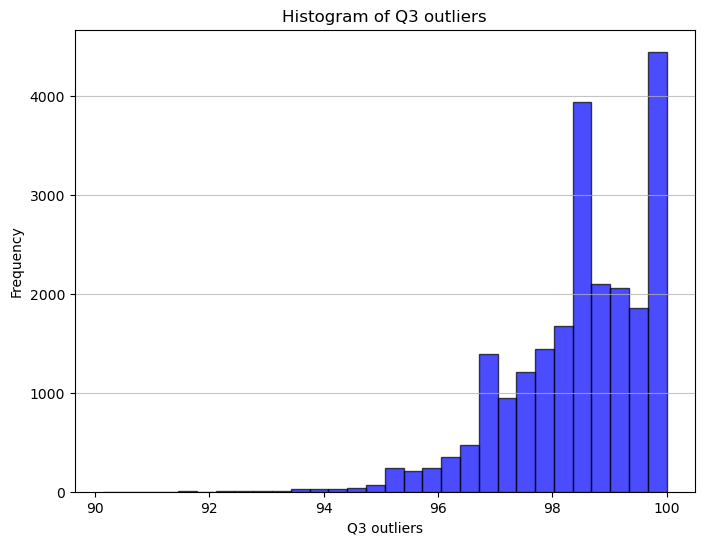

In [67]:
# Plot a histogram for the 'q1_gaps' column
variable = 'q3_outliers'
label = variable.lower().replace('_', ' ').capitalize()
plt.figure(figsize=(8, 6))
plt.hist(df_qc_info[variable], bins=30, color='blue', alpha=0.7, edgecolor='black')
plt.title(f'Histogram of {label}')
plt.xlabel(label)
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [68]:
df_qc_info['quality_index'] = df_qc_info[['p_availability', 'q1_gaps', 'q2_week', 'q3_outliers']].mean(axis=1)

df_qc_info['quality_label'] = df_qc_info.apply(calculate_quality_label, axis=1)

df_qc_info['final_classif'] = df_qc_info.apply(
    lambda row: 'LQ' if row['quality_label'] in ['4 - Low Quality', '5 - Very Low Quality'] or row['preclassif'] == 'LQ' else 'HQ',
    axis=1
)

df_qc_info.sort_values(['gauge_code', 'year'], inplace=True)

In [69]:
df_qc_info.to_hdf(cemaden_path, key = 'table_qc_info', encoding = 'utf-8', mode='r+', append = False, complevel=9)
df_qc_info

,gauge_code,year,preclassif,p_availability,q1_gaps,q2_week,q3_outliers,quality_index,quality_label,final_classif
0,110018901A,2018,,37.260274,100.000000,79.213015,98.082192,78.638870,4 - Low Quality,LQ
1,110018901A,2019,,94.794521,86.416185,91.236742,97.808219,92.563917,3 - Acceptable Quality,HQ
2,110018901A,2020,,10.382514,0.000000,67.725139,100.000000,44.526913,5 - Very Low Quality,LQ
3,110020501A,2014,LQ,4.383562,100.000000,65.984933,100.000000,67.592124,4 - Low Quality,LQ
4,110020501A,2017,LQ,1.643836,0.000000,61.509982,100.000000,40.788454,5 - Very Low Quality,LQ
...,...,...,...,...,...,...,...,...,...,...
22768,CEMADEN_12,2019,,24.657534,100.000000,90.159144,98.904110,78.430197,4 - Low Quality,LQ
22769,CEMADEN_12,2020,,8.469945,100.000000,88.614499,99.453552,74.134499,4 - Low Quality,LQ
22770,CEMADEN_13,2019,LQ,6.301370,17.391304,64.644661,99.726027,47.015841,5 - Very Low Quality,LQ
22771,CEMADEN_14,2018,,25.205479,100.000000,78.723842,98.356164,75.571371,4 - Low Quality,LQ


# Visual Analysis

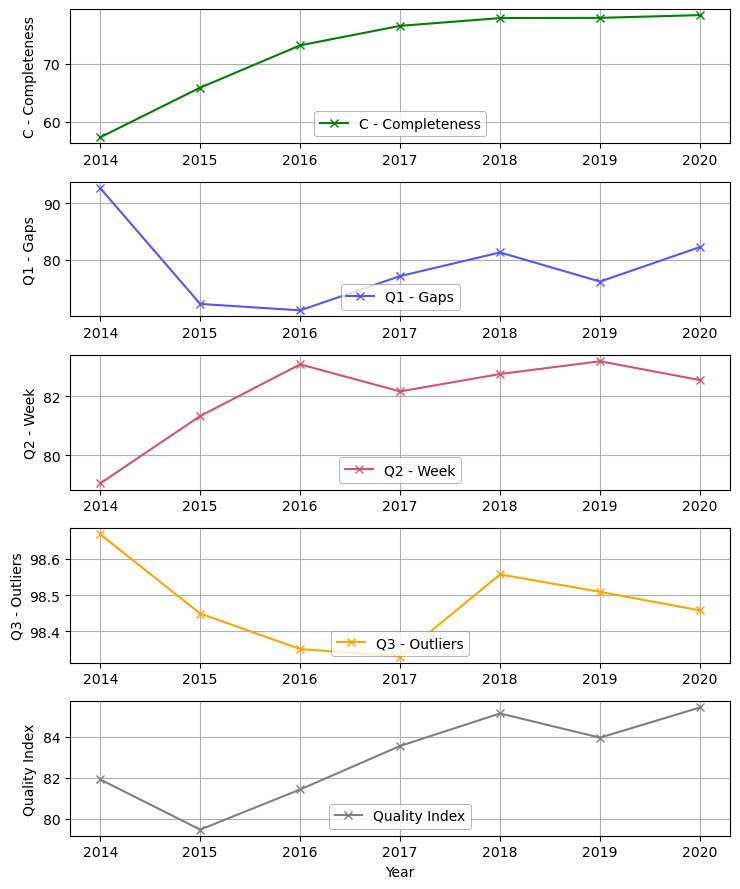

In [70]:
# Calculate the average value of each parameter by year
df_avg_params = df_qc_info.groupby('year').agg({
    'p_availability': 'mean',
    'q1_gaps': 'mean',
    'q2_week': 'mean',
    'q3_outliers': 'mean',
    'quality_index': 'mean'
}).reset_index()

# Create a figure and axis with a custom size
fig, ax = plt.subplots(5, 1, figsize=(7.5, 9), sharex=True)

# Plot each parameter
ax0 = ax[0]
ax0.plot(df_avg_params['year'], df_avg_params['p_availability'], marker='x', color='g', label='C - Completeness')
ax0.set_ylabel('C - Completeness')
ax0.grid(True)
lines, labels = ax0.get_legend_handles_labels()
legend = ax0.legend(lines , labels + labels, loc='lower center')
legend.set_frame_on(True)  # Ensure frame is visible
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)


ax1 = ax[1]
ax1.plot(df_avg_params['year'], df_avg_params['q1_gaps'], marker='x', color='#5555ff', label='Q1 - Gaps')
ax1.set_ylabel('Q1 - Gaps')
ax1.grid(True)
lines, labels = ax1.get_legend_handles_labels()
legend = ax1.legend(lines , labels + labels, loc='lower center')
legend.set_frame_on(True)  # Ensure frame is visible
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)


ax2 = ax[2]
ax2.plot(df_avg_params['year'], df_avg_params['q2_week'], marker='x', color='#d3546e', label='Q2 - Week')
ax2.set_ylabel('Q2 - Week')
ax2.grid(True)
lines, labels = ax2.get_legend_handles_labels()
legend = ax2.legend(lines , labels + labels, loc='lower center')
legend.set_frame_on(True)  # Ensure frame is visible
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)


ax3 = ax[3]
ax3.ylim = (97, None)
ax3.plot(df_avg_params['year'], df_avg_params['q3_outliers'], marker='x', color='Orange', label='Q3 - Outliers')
ax3.set_ylabel('Q3 - Outliers')
ax3.grid(True)
lines, labels = ax3.get_legend_handles_labels()
legend = ax3.legend(lines , labels + labels, loc='lower center')
legend.set_frame_on(True)  # Ensure frame is visible
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)

ax4 = ax[4]
ax4.plot(df_avg_params['year'], df_avg_params['quality_index'], marker='x', color='grey', label='Quality Index')
ax4.set_xlabel('Year')
ax4.set_ylabel('Quality Index')
ax4.grid(True)
lines, labels = ax4.get_legend_handles_labels()

legend = ax4.legend(lines , labels + labels, loc='lower center')
legend.set_frame_on(True)  # Ensure frame is visible
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)

# Show xticks on all subplots
for a in ax:
    a.label_outer()  # Hides labels except for the last subplot but keeps ticks visible
    a.tick_params(axis='x', which='both', labelbottom=True)  # Ensure xticks are visible
    
plt.tight_layout()
plt.savefig('./figures/quality_index_avg_year_cemaden.tiff', dpi = 300, bbox_inches='tight')
plt.show()
plt.close()

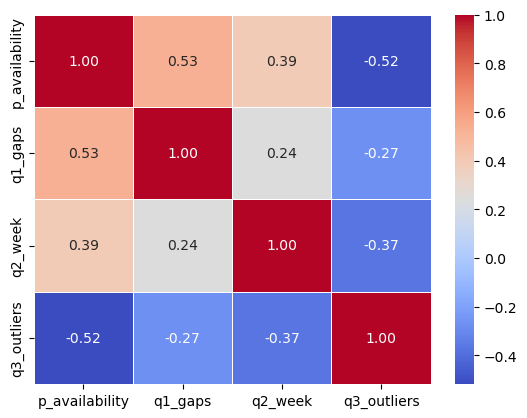

In [71]:
# Select relevant columns for the heatmap
heatmap_data = df_qc_info[['p_availability', 'q1_gaps', 'q2_week', 'q3_outliers']]

# Calculate the correlation matrix
corr = heatmap_data.corr()

# Create a heatmap
# plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
# plt.title('Heatmap of df_qc_info Parameters')
plt.show()

In [72]:
df_qc_count = df_qc_info.groupby('quality_label').size().reset_index(name='count')
df_qc_count['percent'] = (df_qc_count['count'] / df_qc_count['count'].sum()) * 100
df_qc_count

,quality_label,count,percent
0,1 - Excellent Quality,6673,29.302244
1,2 - Good Quality,3521,15.461292
2,3 - Acceptable Quality,1914,8.404690
3,4 - Low Quality,9387,41.219866
4,5 - Very Low Quality,1278,5.611909


In [73]:
df_qc_avg = df_qc_info.groupby('quality_label').agg({'p_availability': 'mean'
                                                     , 'q1_gaps':'mean'
                                                     , 'q2_week':'mean'
                                                     , 'q3_outliers':'mean'
                                                     }).reset_index()
df_qc_avg

,quality_label,p_availability,q1_gaps,q2_week,q3_outliers
0,1 - Excellent Quality,99.934895,99.823155,86.354127,97.868253
1,2 - Good Quality,97.442181,93.702766,85.405798,98.118020
2,3 - Acceptable Quality,92.566248,91.280598,83.968966,98.192428
3,4 - Low Quality,50.612199,64.951425,80.550969,98.917134
4,5 - Very Low Quality,12.504943,0.350910,61.597859,99.601688


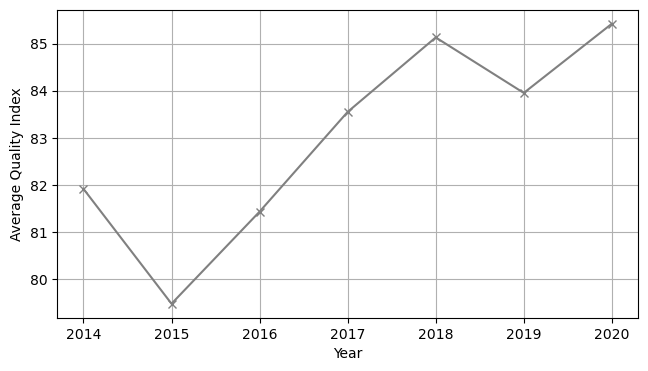

In [74]:
# Calculate the average quality index over the years
df_avg_quality_index = df_qc_info.groupby('year')['quality_index'].mean().reset_index()

# Create a figure and axis with a custom size
fig, ax = plt.subplots(figsize=(7.5, 4))

# Plot the average quality index over the years
ax.plot(df_avg_quality_index['year'], df_avg_quality_index['quality_index'], marker='x', color='grey', label='Average Quality Index')

# Add labels, title, and grid
ax.set_xlabel('Year')
ax.set_ylabel('Average Quality Index')
# ax.set_title('Average Quality Index Over the Years')
ax.grid(True)

plt.savefig('./figures/quality_index_over_the_years_cemaden.png', dpi=1800, bbox_inches='tight')
plt.show()
plt.close()

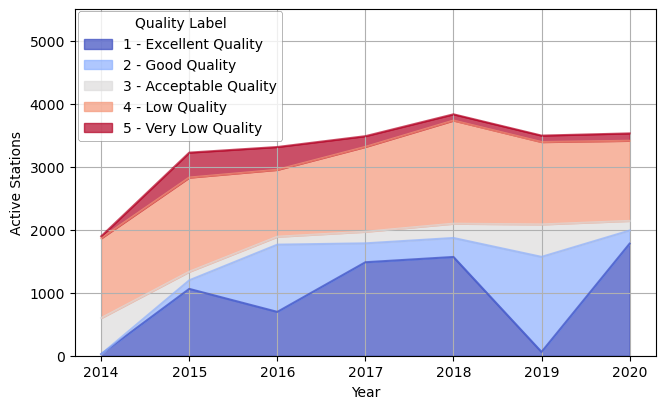

In [75]:

# Group by year and quality label to get the count of active stations
df_active_stations = df_qc_info.groupby(['year', 'quality_label']).size().unstack(fill_value=0)

# Create a stacked area plot with updated figure size
fig, ax = plt.subplots(figsize=(7.5, 4.5))

# Use a colorblind-friendly colormap
df_active_stations.plot(kind='area', stacked=True, ax=ax, colormap='coolwarm', alpha=0.7)

# Add labels, title, and grid
ax.set_xlabel('Year')
ax.set_ylabel('Active Stations')
# ax.set_title('Count of Active Stations by Year and Quality Label')
ax.grid(True)
ax.set_ylim(0, 5500)
# Modify the EXISTING legend from pandas plot
legend = ax.legend()
legend.set_title('Quality Label')  # Set title
legend.set_bbox_to_anchor((0.369, 0.6))  # Set legend position
legend.set_frame_on(True)  # Ensure frame is visible

# Customize frame properties
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('grey')
frame.set_linewidth(0.5)

plt.savefig('./figures/active_stations_by_year_and_quality_label_cemaden.tiff', dpi=300, bbox_inches='tight')

plt.show()
plt.close()

In [ ]:
print(time.strftime("%Y-%m-%d %H:%M:%S", time.localtime()))

2025-04-19 21:06:56
